# Phase 1: Data Exploration and Cleaning

In this phase I use exploratory data analysis (EDA) for the project:
- Load site-level FLUXNET daily datasets and combine into one table
- Inspect structure, missingness, distributions, and correlations
- Engineer candidate features for downstream modeling
- Save a processed dataset for later notebooks

## 0. Set path

In [ ]:
# --- Mount Google Drive and point ROOT at your repo on Drive ---
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Repo setup: paths, clean output, reproducibility

from pathlib import Path
import warnings
warnings.filterwarnings('ignore')  # keep output tidy

# consistent seed across models/transforms
RANDOM_STATE = 42

# hard-coded Drive path fallback
drive_repo = Path("/content/drive/MyDrive/GitHub/fluxnet-gpp-ml")

# find the repo root (folder containing .git); fallback = hard-coded Drive path
def find_repo_root(start: Path = Path.cwd()) -> Path:
    for p in [start, *start.parents]:
        if (p / ".git").exists():
            return p
    if drive_repo.exists():
        return drive_repo
    return start
ROOT = find_repo_root()

# standard project paths
DATA_RAW       = ROOT / "data" / "raw"
DATA_PROCESSED = ROOT / "data" / "processed"
RESULTS        = ROOT / "results"
RESULTS.mkdir(parents=True, exist_ok=True)

# tiny helper: save figures nicely
def savefig(path: Path):
    """Apply to plots to save with tight bounding box."""
    import matplotlib.pyplot as plt
    path.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(path, dpi=150, bbox_inches="tight")

print("ROOT:", ROOT)
print("DATA_PROCESSED:", DATA_PROCESSED)
print("RESULTS:", RESULTS)


ROOT: /content/drive/MyDrive/GitHub/machine-learning-final-project
DATA_PROCESSED: /content/drive/MyDrive/GitHub/machine-learning-final-project/data/processed
RESULTS: /content/drive/MyDrive/GitHub/machine-learning-final-project/results


## 1. Data sources and loading

I used daily ecosystem flux data sets, from the FLUXNET2015 database.

I decided to combine datasets from six different FLUXNET sites:

• US-Var (Vaira Ranch — grassland ecosystem)

• US-Ton (Tonzi Ranch — oak savanna)

• US-MMS (Morgan Monroe State Forest — deciduous broadleaf forest)

• US-Kon (Konza Prairie — native tallgrass prairie)

• US-UMB (University of Michigan Biological Station — mixed forest)

• US-Ha1 (Harvard Forest EMS — deciduous forest)

First step is to join them into one cohesive dataset for unified preprocessing and modeling.

In [ ]:
import pandas as pd
import numpy as np
import glob

### ------------------ Concate the complete dataframe -----------------------###

# Define files and corresponding site names
site_files = {
    "US-Var": DATA_RAW / "AMF_US-Var_FLUXNET_SUBSET_DD_2000-2021_3-5.csv",
    "US-UMB": DATA_RAW / "AMF_US-UMB_FLUXNET_SUBSET_DD_2007-2021_3-5.csv",
    "US-Ton": DATA_RAW / "AMF_US-Ton_FLUXNET_SUBSET_DD_2001-2023_4-6.csv",
    "US-MMS": DATA_RAW / "AMF_US-MMS_FLUXNET_SUBSET_DD_1999-2020_3-5.csv",
    "US-Kon": DATA_RAW / "AMF_US-Kon_FLUXNET_SUBSET_DD_2004-2019_4-6.csv",
    "US-Ha1": DATA_RAW / "AMF_US-Ha1_FLUXNET_SUBSET_DD_1991-2020_3-5.csv"
}


# Define target and predictors
target = "GPP_NT_VUT_REF"
predictors = [
    "TA_F",        # Air temperature
    "VPD_F",       # Vapor pressure deficit
    "SW_IN_F",     # Shortwave radiation
    "PA_F",        # Air pressure
    "P_F",         # Precipitation
    "WS_F",        # Wind speed
    "LE_F_MDS",    # Latent heat flux
    "H_F_MDS",     # Sensible heat flux
    "PPFD_IN",     # Photosynthetic photon flux density
    "NETRAD"       # Net radiation
]

# Select columns
columns = ["TIMESTAMP", target] + predictors

# Load, label, and clean all data
dataframes = []
for site, filename in site_files.items():
    df = pd.read_csv(filename)
    df.replace(-9999, np.nan, inplace=True)
    df = df[columns].copy()
    df["site"] = site
    df.dropna(subset=[target] + predictors, inplace=True)
    dataframes.append(df)


# Concatenate all into one dataframe
df_all = pd.concat(dataframes, ignore_index=True)

print(f"Combined dataset shape: {df_all.shape}")
print("Sample rows:")
print(df_all.head())

# Save to CSV
out_path = DATA_PROCESSED / "combined_GPP_daily_FLUXNET.csv"
df_all.to_csv(out_path, index=False)
print("Saved processed dataset to:", out_path)



Combined dataset shape: (35447, 13)
Sample rows:
   TIMESTAMP  GPP_NT_VUT_REF    TA_F   VPD_F  SW_IN_F    PA_F    P_F   WS_F  \
0   20001023         2.62240  15.701  13.275  144.241  99.323   0.00  1.491   
1   20001024         2.91881  17.417  13.553  145.474  99.766   0.00  1.271   
2   20001025         2.34361  12.739   3.778  151.173  99.274   9.40  1.507   
3   20001026         2.53444  11.951   1.259  145.879  98.674  12.71  1.061   
4   20001027         2.73883  13.275   0.054  143.659  98.925   0.25  1.038   

   LE_F_MDS  H_F_MDS     PPFD_IN     NETRAD    site  
0   36.6987  15.8514  320.536437  31.407500  US-Var  
1   35.0201  15.1848  323.274771  32.938333  US-Var  
2   27.9223  19.6019  335.939979 -17.709167  US-Var  
3   24.5069  17.9867  324.175317  -6.443104  US-Var  
4   26.5328  19.5727  319.243033  43.107917  US-Var  
Saved processed dataset to: /content/drive/MyDrive/GitHub/machine-learning-final-project/data/processed/combined_GPP_daily_FLUXNET.csv


## 2. Dataset Structure and Overview

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# === Load the Combined Data Set ===
df_all = pd.read_csv(DATA_PROCESSED / "combined_GPP_daily_FLUXNET.csv")

# datset shape check
print(f"Combined dataset shape: {df_all.shape}")
print("Sample rows:")
print(df_all.head())

# Get basic descriptive statistics
descriptives = df_all.describe()

# Get count of rows per site
site_counts = df_all["site"].value_counts().rename_axis("site").reset_index(name="row_count")

# Display the stats
print("\n📈 Descriptive statistics:")
print(descriptives)

print("\n📍 Number of records per site:")
print(site_counts)

# === Data Types, Missing Values, and Overview ===
print("\nData types:\n", df_all.dtypes)
print("\nMissing values per column:\n", df_all.isnull().sum())
print("\nUnique sites:", df_all['site'].nunique())
print("\nSite counts:\n", df_all['site'].value_counts())


Combined dataset shape: (35447, 13)
Sample rows:
   TIMESTAMP  GPP_NT_VUT_REF    TA_F   VPD_F  SW_IN_F    PA_F    P_F   WS_F  \
0   20001023         2.62240  15.701  13.275  144.241  99.323   0.00  1.491   
1   20001024         2.91881  17.417  13.553  145.474  99.766   0.00  1.271   
2   20001025         2.34361  12.739   3.778  151.173  99.274   9.40  1.507   
3   20001026         2.53444  11.951   1.259  145.879  98.674  12.71  1.061   
4   20001027         2.73883  13.275   0.054  143.659  98.925   0.25  1.038   

   LE_F_MDS  H_F_MDS     PPFD_IN     NETRAD    site  
0   36.6987  15.8514  320.536437  31.407500  US-Var  
1   35.0201  15.1848  323.274771  32.938333  US-Var  
2   27.9223  19.6019  335.939979 -17.709167  US-Var  
3   24.5069  17.9867  324.175317  -6.443104  US-Var  
4   26.5328  19.5727  319.243033  43.107917  US-Var  

📈 Descriptive statistics:
          TIMESTAMP  GPP_NT_VUT_REF          TA_F         VPD_F       SW_IN_F  \
count  3.544700e+04    35447.000000  35447.0

## 3. Correlation Analysis

correlations Of All features (Predictors + Target)

                TA_F  VPD_F  SW_IN_F  PA_F   P_F  WS_F  LE_F_MDS  H_F_MDS  \
TA_F            1.00   0.72     0.65 -0.03 -0.03 -0.25      0.46     0.34   
VPD_F           0.72   1.00     0.68  0.07 -0.21 -0.25      0.14     0.58   
SW_IN_F         0.65   0.68     1.00  0.07 -0.30 -0.25      0.53     0.75   
PA_F           -0.03   0.07     0.07  1.00 -0.14 -0.53     -0.20     0.18   
P_F            -0.03  -0.21    -0.30 -0.14  1.00  0.14     -0.08    -0.30   
WS_F           -0.25  -0.25    -0.25 -0.53  0.14  1.00      0.03    -0.27   
LE_F_MDS        0.46   0.14     0.53 -0.20 -0.08  0.03      1.00     0.01   
H_F_MDS         0.34   0.58     0.75  0.18 -0.30 -0.27      0.01     1.00   
PPFD_IN         0.66   0.68     0.98  0.09 -0.29 -0.23      0.51     0.75   
NETRAD          0.60   0.55     0.89  0.03 -0.21 -0.22      0.55     0.63   
GPP_NT_VUT_REF  0.47   0.04     0.41 -0.14 -0.02 -0.02      0.86    -0.08   

                PPFD_IN

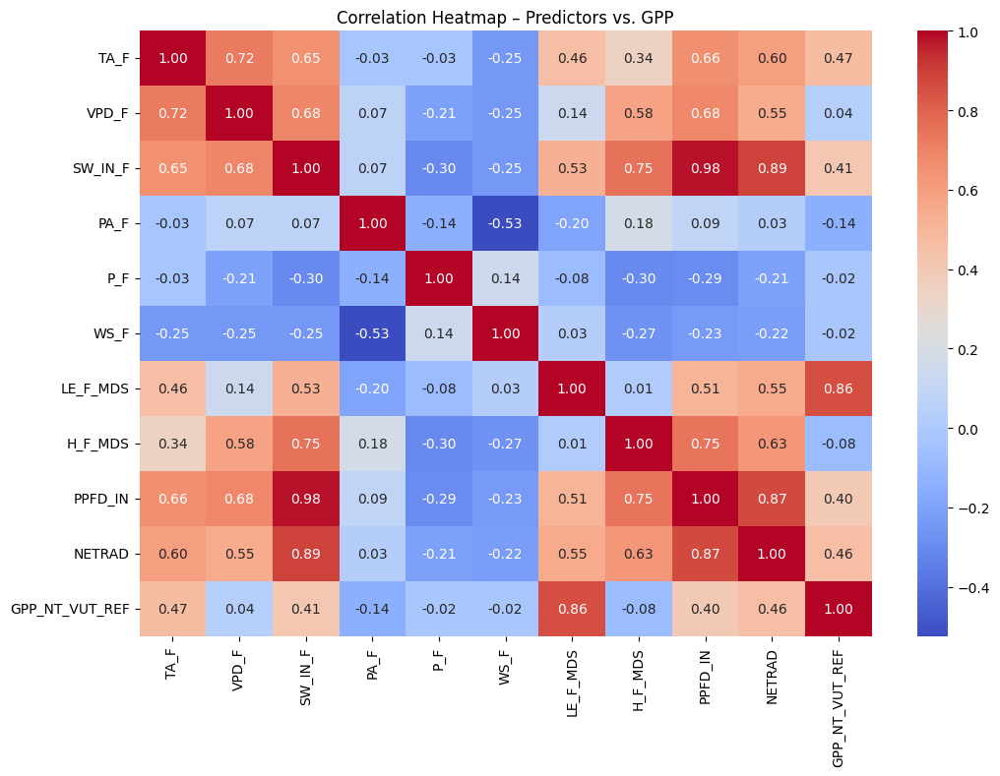


Correlations of refined features (Choosen Predictors + Target)

                TA_F  VPD_F  PA_F   P_F  WS_F  LE_F_MDS  H_F_MDS  PPFD_IN  \
TA_F            1.00   0.72 -0.03 -0.03 -0.25      0.46     0.34     0.66   
VPD_F           0.72   1.00  0.07 -0.21 -0.25      0.14     0.58     0.68   
PA_F           -0.03   0.07  1.00 -0.14 -0.53     -0.20     0.18     0.09   
P_F            -0.03  -0.21 -0.14  1.00  0.14     -0.08    -0.30    -0.29   
WS_F           -0.25  -0.25 -0.53  0.14  1.00      0.03    -0.27    -0.23   
LE_F_MDS        0.46   0.14 -0.20 -0.08  0.03      1.00     0.01     0.51   
H_F_MDS         0.34   0.58  0.18 -0.30 -0.27      0.01     1.00     0.75   
PPFD_IN         0.66   0.68  0.09 -0.29 -0.23      0.51     0.75     1.00   
NETRAD          0.60   0.55  0.03 -0.21 -0.22      0.55     0.63     0.87   
GPP_NT_VUT_REF  0.47   0.04 -0.14 -0.02 -0.02      0.86    -0.08     0.40   

                NETRAD  GPP_NT_VUT_REF  
TA_F              0.60            0.47  
VPD_F

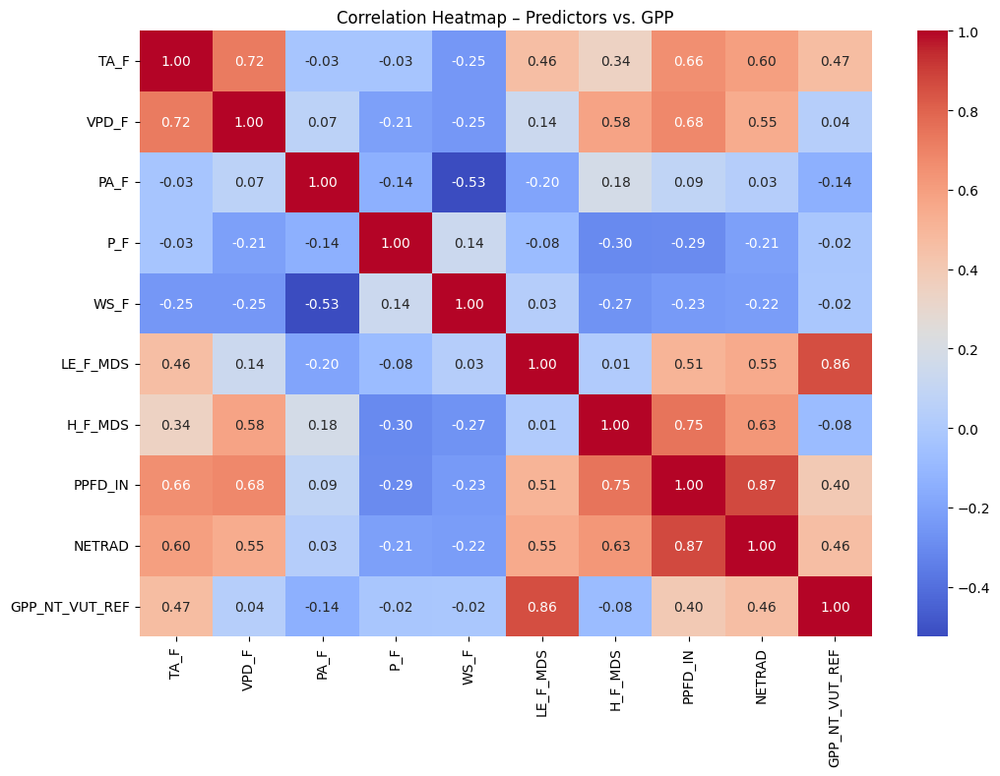

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# === Correlation Matrix ===
correlation = df_all[predictors + [target]].corr()
print("correlations Of All features (Predictors + Target)\n")
print(correlation.round(2))

plt.figure(figsize=(12, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap – Predictors vs. GPP")
plt.show()

# Safely drop SW_IN_F if it's still in the data
if "SW_IN_F" in df.columns:
  df.drop(columns=["SW_IN_F"], inplace=True)

# Safely remove from predictors
if "SW_IN_F" in predictors:
    predictors.remove("SW_IN_F")

# === Recalculate and show Correlation Matrix ===
correlation = df_all[predictors + [target]].corr()
print("\nCorrelations of refined features (Choosen Predictors + Target)\n")
print(correlation.round(2))

plt.figure(figsize=(12, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap – Predictors vs. GPP")
plt.show()


## 4. Visual Exploration and Pattern Detection

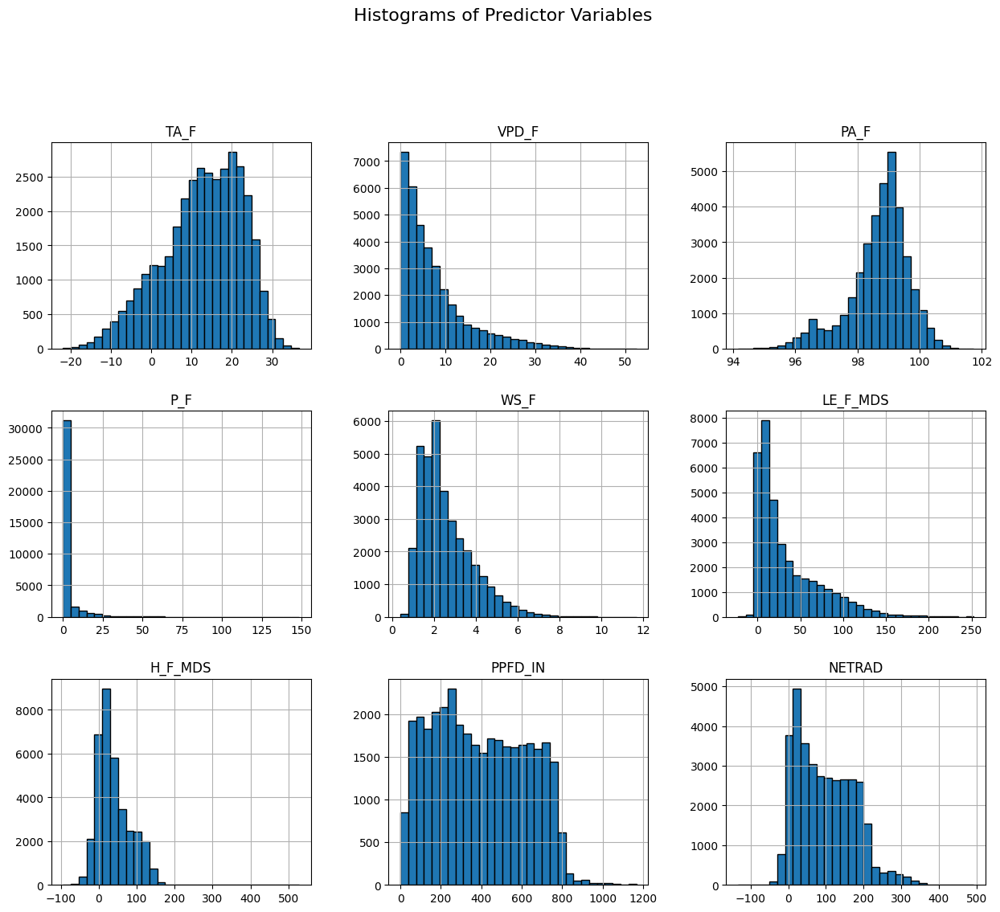

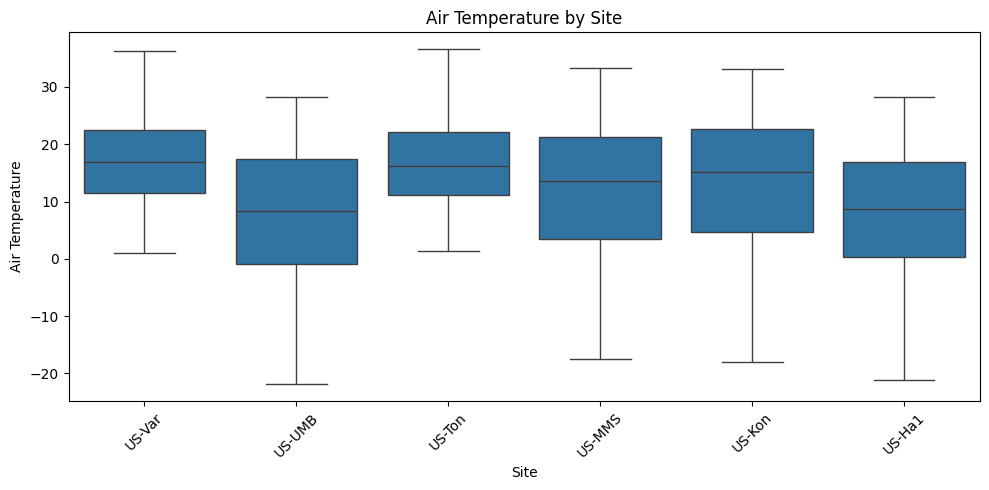

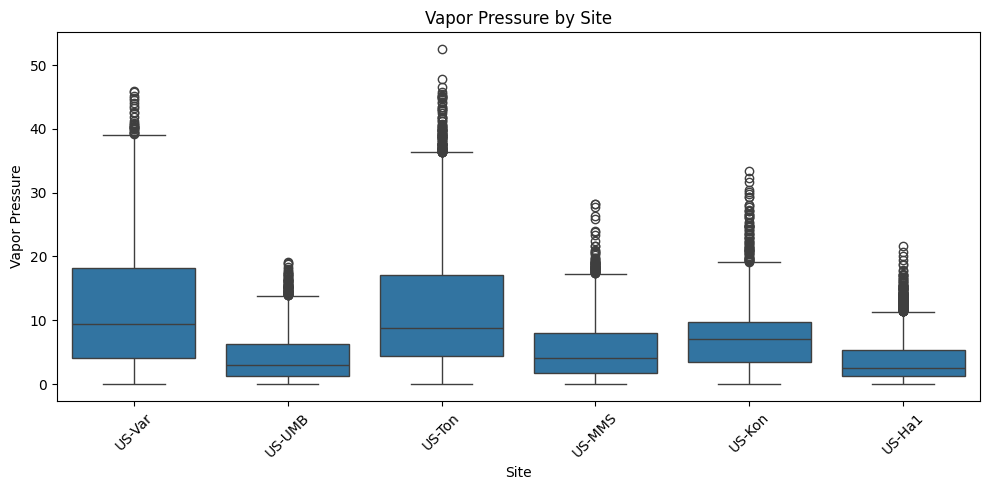

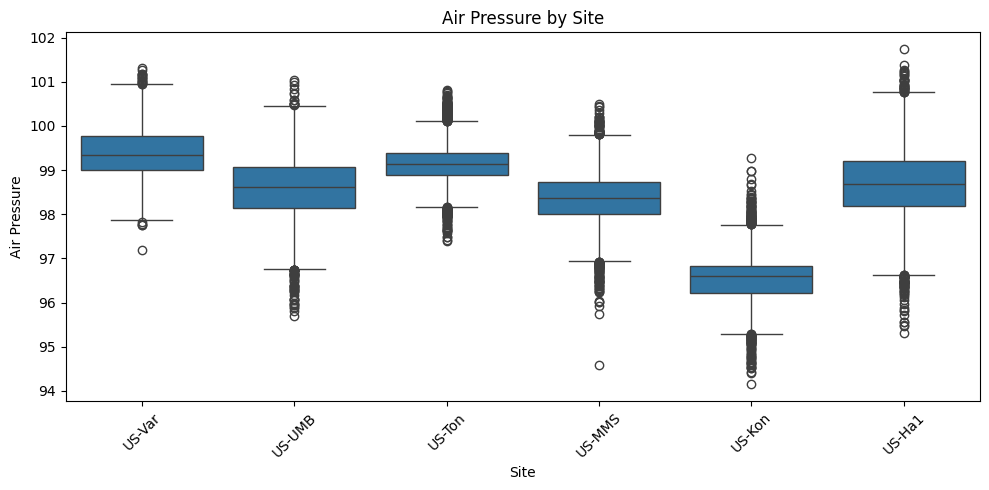

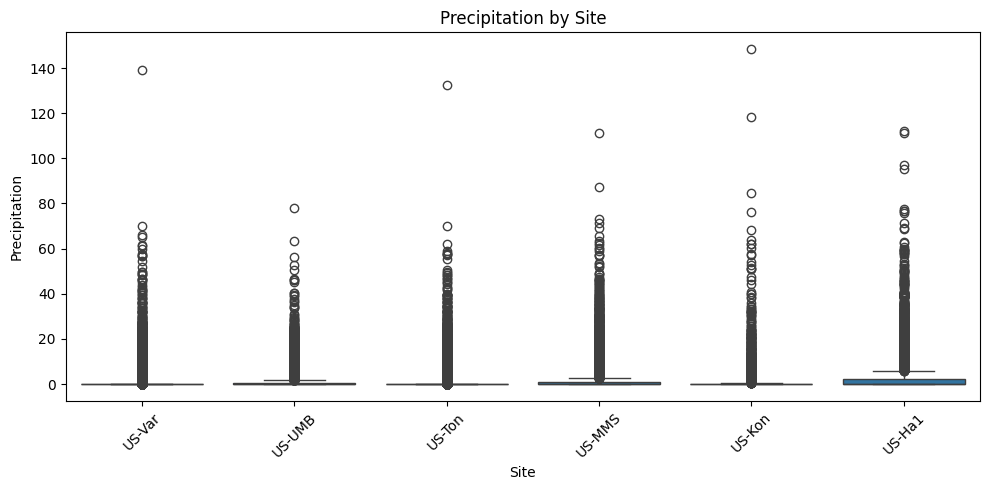

...

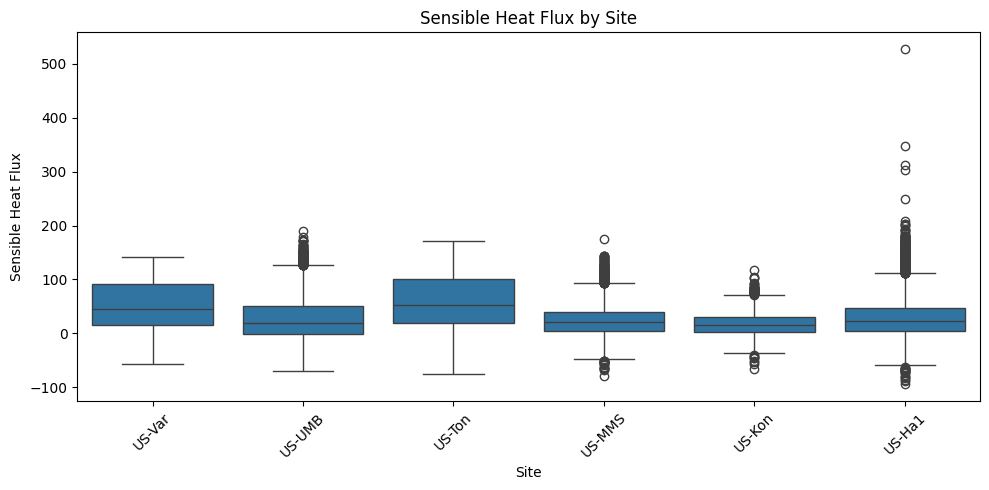

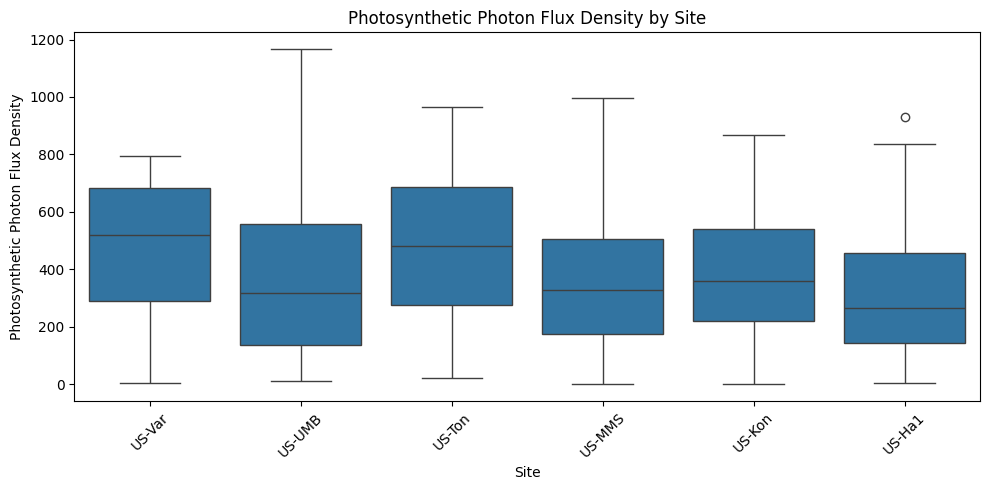

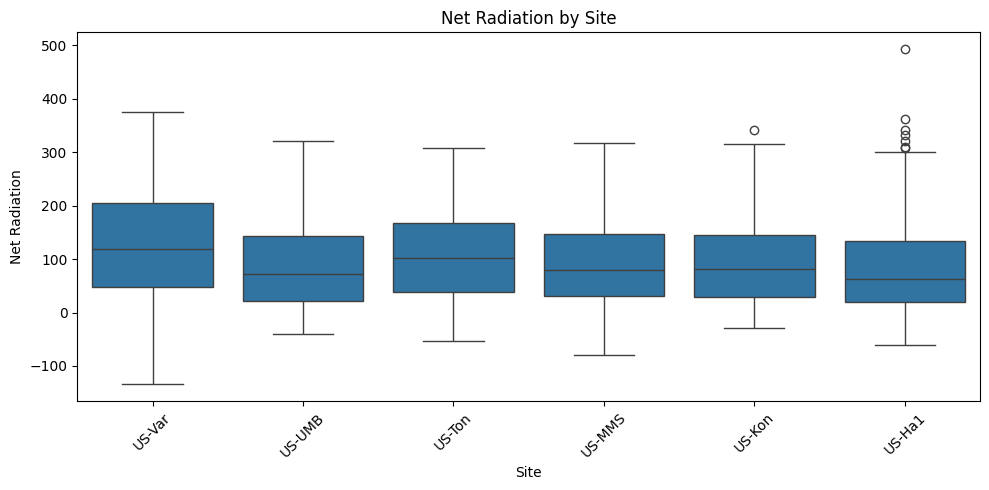

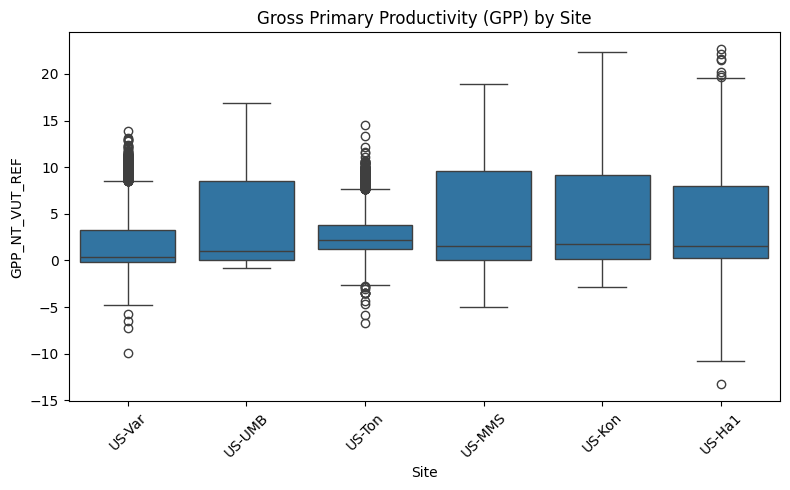

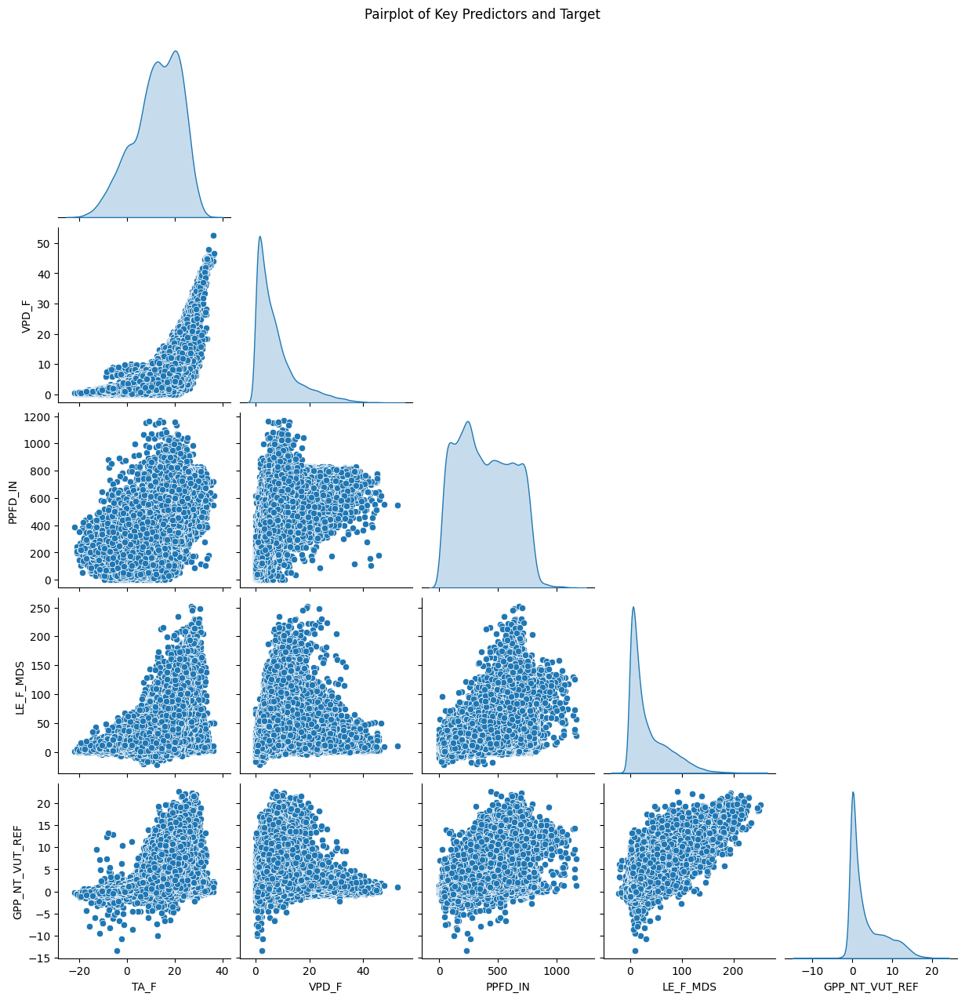

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# for readble plot title, define features code:name dictionary
feature_names = {
    "GPP_NT_VUT_REF": "Gross Primary Productivity",
    "TA_F": "Air Temperature",
    "VPD_F": "Vapor Pressure",
    "PPFD_IN": "Photosynthetic Photon Flux Density",
    "PA_F": "Air Pressure",
    "P_F": "Precipitation",
    "WS_F": "Wind Speed",
    "LE_F_MDS": "Latent Heat Flux",
    "H_F_MDS": "Sensible Heat Flux",
    "NETRAD": "Net Radiation"
}

# === 1. Histograms of all predictors ===
ax = df_all[predictors].hist(bins=30, figsize=(15, 12), edgecolor='black')
plt.suptitle("Histograms of Predictor Variables", fontsize=16, y=1.02)
plt.savefig(RESULTS / "histograms_predictors.png")
plt.show()

# === 2. Boxplots of predictors by site ===
for feature in predictors:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x="site", y=feature, data=df_all)
    title = feature_names.get(feature, feature)
    plt.title(f"{title} by Site")
    plt.xlabel("Site")
    plt.ylabel(title)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(RESULTS / f"boxplot_{feature}.png")
    plt.show()

# === 3. Boxplot for GPP by site ===
plt.figure(figsize=(8, 5))
sns.boxplot(x="site", y=target, data=df_all)
plt.title("Gross Primary Productivity (GPP) by Site")
plt.xlabel("Site")
plt.ylabel("GPP_NT_VUT_REF")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(RESULTS / "boxplot_gpp_by_site.png")
plt.show()

# === 4. Pairplots (scatter matrix) for a subset of predictors  ===
subset_features = ["TA_F", "VPD_F", "PPFD_IN", "LE_F_MDS", target]
sns.pairplot(df_all[subset_features], diag_kind="kde", corner=True)
plt.suptitle("Pairplot of Key Predictors and Target", y=1.02)
plt.savefig(RESULTS / "pairplot_subset.png")
plt.show()

## 5. Feature Engineering

Several additional features were created to capture non-linear and temporal dynamics:

- `TEMP_X_VPD` = interaction between air temperature and vapor pressure deficit  
- `RADIATION_BALANCE` = combined measure of net radiation and photon flux density  
- `GPP_LAG1` = one-day lag of gross primary productivity  
- `GPP_DIFF` = day-to-day change in gross primary productivity  
- `GPP_VAR7` = seven-day rolling variance of gross primary productivity  

These features enhance the predictor set by representing combined environmental stress, energy balance, and short-term temporal trends.  
All features were standardized (mean = 0, std = 1) for use in subsequent modeling.


Missing values per column:
 TIMESTAMP            0
GPP_NT_VUT_REF       0
TA_F                 0
VPD_F                0
SW_IN_F              0
PA_F                 0
P_F                  0
WS_F                 0
LE_F_MDS             0
H_F_MDS              0
PPFD_IN              0
NETRAD               0
site                 0
TEMP_X_VPD           0
GPP_LAG1             0
GPP_DIFF             0
GPP_VAR7             0
RADIATION_BALANCE    0
dtype: int64

Correlation with GPP (incl. engineered features):

GPP_NT_VUT_REF       1.00
GPP_LAG1             0.94
LE_F_MDS             0.86
GPP_VAR7             0.50
TA_F                 0.47
NETRAD               0.46
RADIATION_BALANCE    0.45
PPFD_IN              0.40
GPP_DIFF             0.17
TEMP_X_VPD           0.05
VPD_F                0.03
WS_F                -0.02
P_F                 -0.02
H_F_MDS             -0.08
PA_F                -0.14
Name: GPP_NT_VUT_REF, dtype: float64


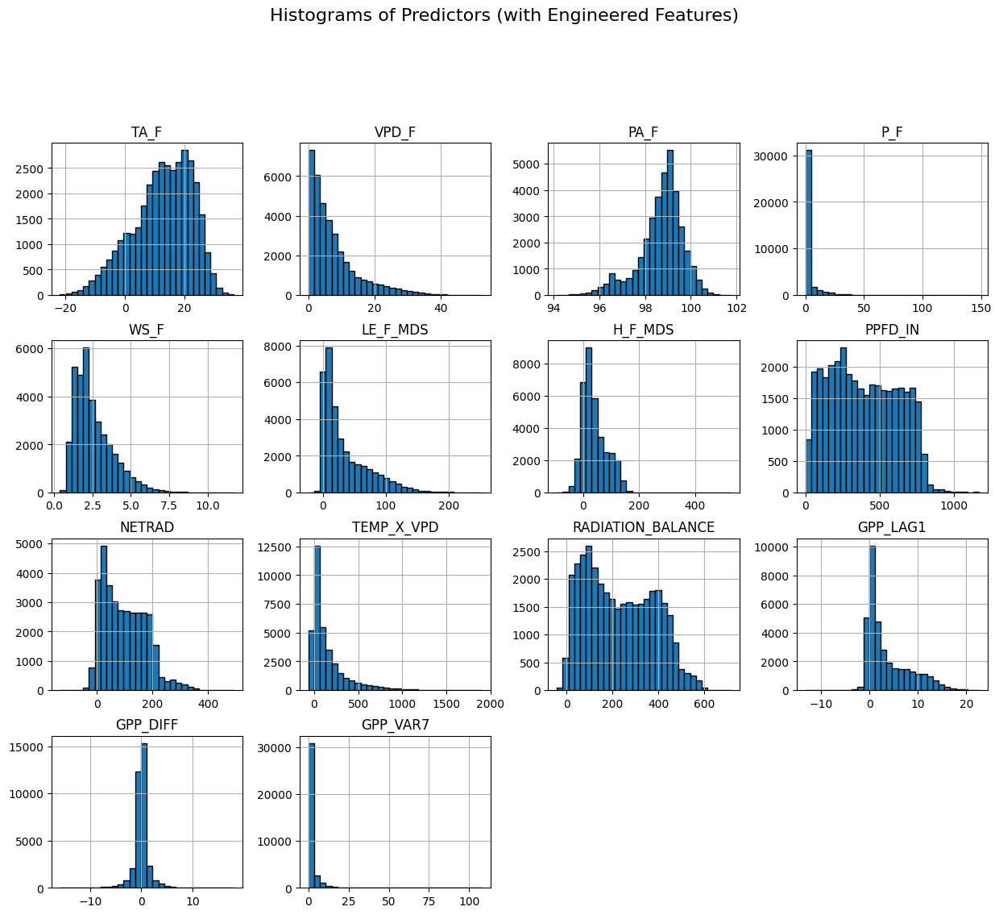


Correlation of Standardized Predictor with GPP (incl. engineered features):

GPP_NT_VUT_REF       1.00
GPP_LAG1             0.94
LE_F_MDS             0.86
GPP_VAR7             0.50
TA_F                 0.47
NETRAD               0.46
RADIATION_BALANCE    0.45
PPFD_IN              0.40
GPP_DIFF             0.17
TEMP_X_VPD           0.05
VPD_F                0.03
WS_F                -0.02
P_F                 -0.02
H_F_MDS             -0.08
PA_F                -0.14
Name: GPP_NT_VUT_REF, dtype: float64


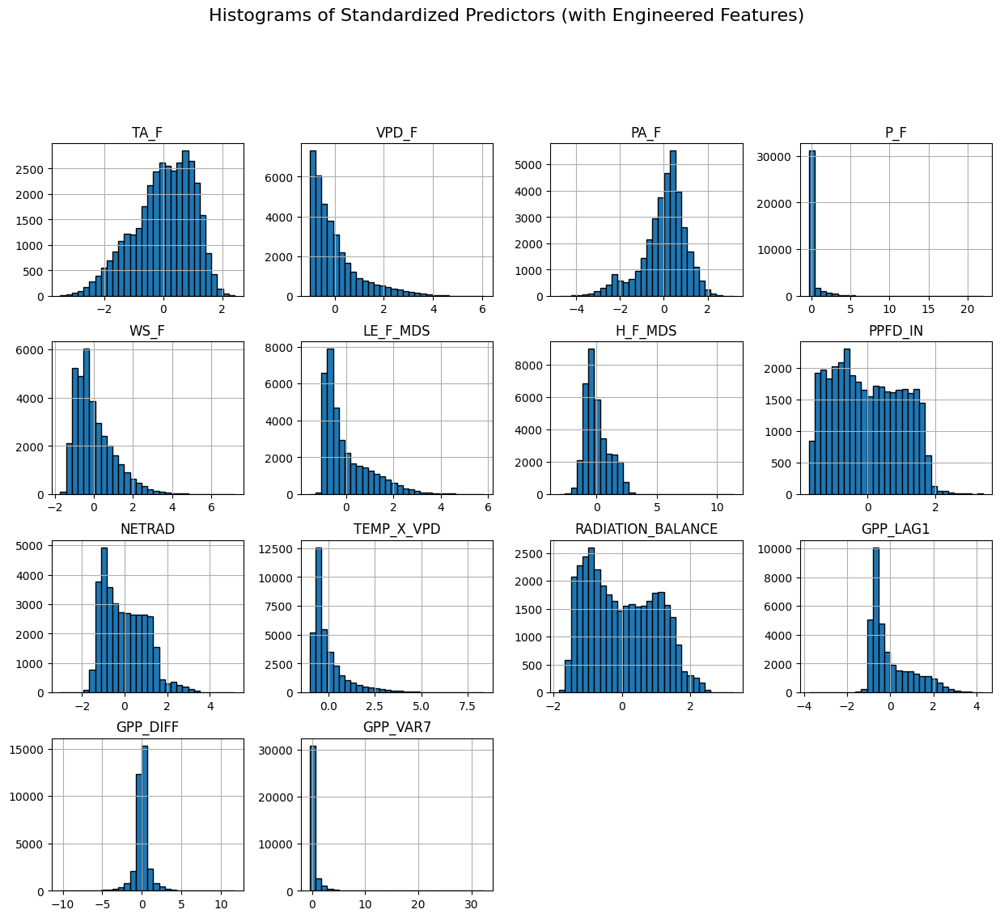

In [ ]:
import numpy as np
from sklearn.preprocessing import StandardScaler

# === Create New Features  ===
# 1) Interaction term: temperature × Vapor Pressure Deficit
if "TEMP_X_VPD" not in df_all.columns:
    df_all["TEMP_X_VPD"] = df_all["TA_F"] * df_all["VPD_F"]
# 2) Radiation balance
PAR_W = df_all["PPFD_IN"] / 4.6  # ≈ W/m² (1 W/m² PAR ≈ 4.6 µmol m⁻² s⁻¹)
Rn    = df_all["NETRAD"]
# alpha for the two terms have comparable variance (no arbitrary dominance)
alpha = Rn.std(ddof=0) / (PAR_W.std(ddof=0) + 1e-9)
if "RADIATION_BALANCE" not in df_all.columns:
  df_all["RADIATION_BALANCE"] = Rn + alpha * PAR_W

# Add to predictors list (only if not already added)
for col in ["TEMP_X_VPD", "RADIATION_BALANCE"]:
    if col not in predictors:
        predictors.append(col)

# === Create Temporal Features Per Site ===
df_all = df_all.sort_values(["site", "TIMESTAMP"])

# Create temporal features only if they don't exist
if "GPP_LAG1" not in df_all.columns:
    df_all["GPP_LAG1"] = df_all.groupby("site")[target].shift(1)

if "GPP_DIFF" not in df_all.columns:
    df_all["GPP_DIFF"] = df_all[target] - df_all["GPP_LAG1"]

if "GPP_VAR7" not in df_all.columns:
    df_all["GPP_VAR7"] = df_all.groupby("site")[target].rolling(window=7).var().reset_index(0, drop=True)

# Drop rows with missing values caused by shifting/rolling
df_all.dropna(subset=["GPP_LAG1", "GPP_DIFF", "GPP_VAR7"], inplace=True)

# make sure no missing values in dataset
print("\nMissing values per column:\n", df_all.isnull().sum())

# Add to predictors list (only if not already added)
for col in ["GPP_LAG1", "GPP_DIFF", "GPP_VAR7"]:
    if col not in predictors:
        predictors.append(col)


# Check new correlation of engineered features
correlation = df_all[predictors + [target]].corr()
print("\nCorrelation with GPP (incl. engineered features):\n")
print(correlation[target].sort_values(ascending=False).round(2))

# === Histograms of all features (include engineered features)===
df_all[predictors].hist(bins=30, figsize=(15, 12), edgecolor="black")
plt.suptitle("Histograms of Predictors (with Engineered Features)", fontsize=16, y=1.02)
plt.savefig(RESULTS / "histograms_predictors_engineered.png")
plt.show()

# === Scale All Features  ===
scaler = StandardScaler()
df_scaled = df_all.copy()
df_scaled[predictors] = scaler.fit_transform(df_all[predictors])

# Check correlation of standardized engineered features
correlation = df_scaled[predictors + [target]].corr()
print("\nCorrelation of Standardized Predictor with GPP (incl. engineered features):\n")
print(correlation[target].sort_values(ascending=False).round(2))

# === Histograms of all standardized predictors ===
df_scaled[predictors].hist(bins=30, figsize=(15, 12), edgecolor="black")
plt.suptitle("Histograms of Standardized Predictors (with Engineered Features)", fontsize=16, y=1.02)
plt.savefig(RESULTS / "histograms_standardized_predictors.png")
plt.show()


# Phase 2: Hypothesis Formulation

## Hypotheses

Based on the business problem and exploratory data analysis, the following hypotheses are proposed:

1. **Supervised Learning Performance**  
   Supervised learning models trained on the selected environmental predictors will be able to predict gross primary productivity (GPP) with meaningful accuracy, demonstrating that the predictors contain usable signal.

2. **Clustering Utility**  
   Unsupervised learning techniques (e.g., clustering) may reveal distinct groupings of observations that correspond to site-level differences or environmental conditions.

3. **Predictor Influence**  
   Radiation-, temperature-, and water-related features (e.g., `NETRAD`, `PPFD_IN`, `TA_F`, `VPD_F`) are expected to be the strongest contributors to variation in GPP.

4. **Site-Level Differences**  
   The distribution of GPP will differ across sites, reflecting site-specific environmental conditions and local variability.


## Most Important Trends, Relationships, and Features Identification

### interaction effects between features and the target

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Fit an interaction model using a few top features (example: TA_F * VPD_F and TA_F * LE_F_MDS)
interaction_model = smf.ols(
    formula="GPP_NT_VUT_REF ~ TA_F * VPD_F + TA_F * LE_F_MDS + LE_F_MDS * VPD_F",
    data=df_all
).fit()

# Summary of interaction terms
print(interaction_model.summary())


                            OLS Regression Results                            
Dep. Variable:         GPP_NT_VUT_REF   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                 2.487e+04
Date:                Sun, 07 Sep 2025   Prob (F-statistic):               0.00
Time:                        12:59:03   Log-Likelihood:                -73727.
No. Observations:               35411   AIC:                         1.475e+05
Df Residuals:                   35404   BIC:                         1.475e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.2264      0.024      9.

### Feature Importance

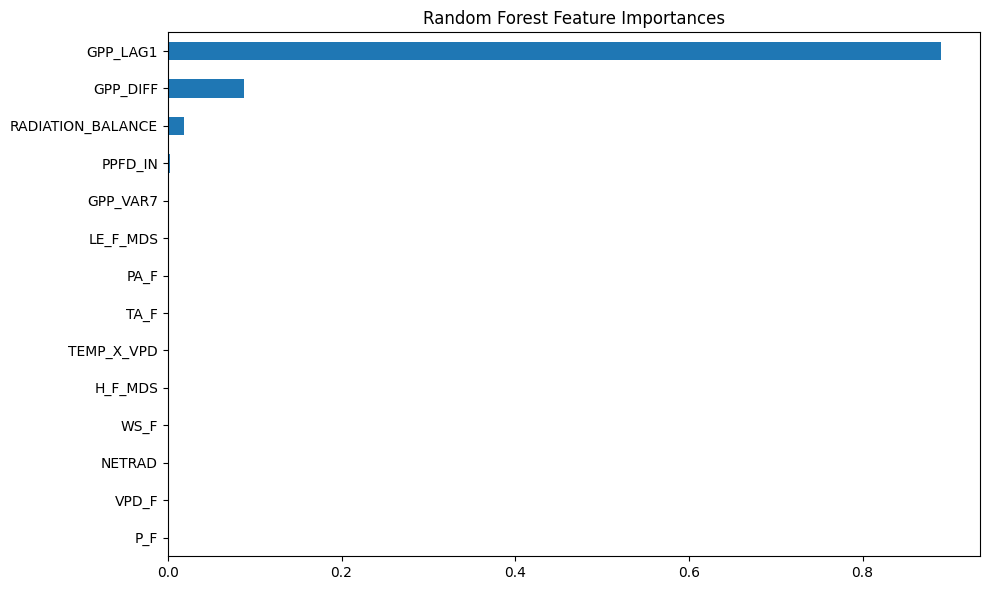

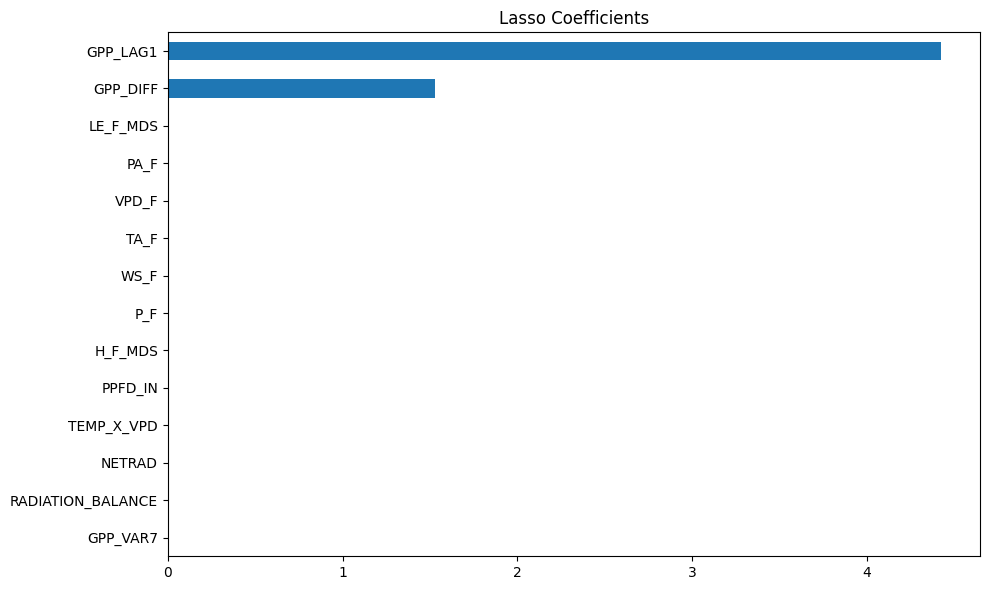

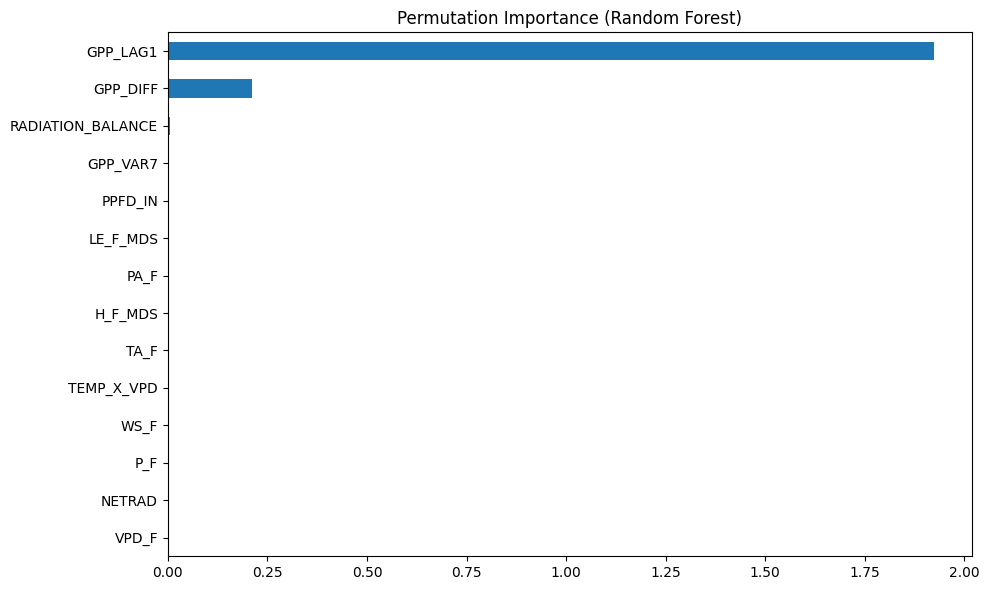


Top 10 Features by Random Forest Importance:
GPP_LAG1             0.890675
GPP_DIFF             0.087247
RADIATION_BALANCE    0.018697
PPFD_IN              0.001949
GPP_VAR7             0.000480
LE_F_MDS             0.000172
PA_F                 0.000136
TA_F                 0.000134
TEMP_X_VPD           0.000113
H_F_MDS              0.000103
dtype: float64

Top 10 Features by Lasso Coefficients:
GPP_LAG1    4.424314
GPP_DIFF    1.530258
LE_F_MDS    0.003423
PA_F       -0.000000
VPD_F      -0.000000
TA_F        0.000000
WS_F       -0.000000
P_F        -0.000000
H_F_MDS    -0.000000
PPFD_IN     0.000000
dtype: float64

Top 10 Features by Permutation Importance:
GPP_LAG1             1.922668
GPP_DIFF             0.210170
RADIATION_BALANCE    0.006378
GPP_VAR7             0.000309
PPFD_IN              0.000309
LE_F_MDS             0.000066
PA_F                 0.000060
H_F_MDS              0.000047
TA_F                 0.000044
TEMP_X_VPD           0.000038
dtype: float64


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LassoCV
from sklearn.feature_selection import SelectFromModel
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Define X and y
X = df_scaled[predictors]
y = df_scaled[target]  # standardized GPP

# === Feature Importance from Random Forest ===
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)
rf_importance = pd.Series(rf.feature_importances_, index=predictors).sort_values(ascending=False)

plt.figure(figsize=(10, 6))
rf_importance.plot(kind="barh")
plt.title("Random Forest Feature Importances")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig(RESULTS / "rf_importance.png")
plt.show()

# === Lasso Regularization ===
lasso = LassoCV(cv=5, random_state=42)
lasso.fit(X, y)
lasso_importance = pd.Series(lasso.coef_, index=predictors).sort_values(ascending=False)

plt.figure(figsize=(10, 6))
lasso_importance.plot(kind="barh")
plt.title("Lasso Coefficients")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig(RESULTS / "lasso_importance.png")
plt.show()

# === Permutation Importance ===
perm = permutation_importance(rf, X, y, n_repeats=10, random_state=42, scoring='r2')
perm_importance = pd.Series(perm.importances_mean, index=predictors).sort_values(ascending=False)

plt.figure(figsize=(10, 6))
perm_importance.plot(kind="barh")
plt.title("Permutation Importance (Random Forest)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig(RESULTS / "perm_importance.png")
plt.show()

# Output top features from each method
print("\nTop 10 Features by Random Forest Importance:")
print(rf_importance.head(10))

print("\nTop 10 Features by Lasso Coefficients:")
print(lasso_importance.head(10))

print("\nTop 10 Features by Permutation Importance:")
print(perm_importance.head(10))


## Hypothesis Update
The highly predictive temporal variables such as GPP_LAG1, GPP_DIFF, and GPP_VAR7 rely on prior knowledge of the target variable. Such features can only be used for forecasting where previous GPP measurements are available. For estimating GPP in new or unmonitored ecosystems, models based on these variables are not applicable. therefore I will identify feature importance excluding any prior knowledge of the target variable

## updated Feature Importance

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
import pandas as pd

# Define past-GPP-related features
gpp_history_features = ["GPP_LAG1", "GPP_DIFF", "GPP_VAR7"]

# Create datasets
predictors_with_gpp = predictors.copy()
predictors_no_gpp = [f for f in predictors if f not in gpp_history_features]

df_with_gpp_history = df_scaled.copy()
df_no_gpp_history = df_scaled.drop(columns=gpp_history_features)

# === Split data ===
X_with_gpp = df_with_gpp_history[predictors_with_gpp]
X_no_gpp = df_no_gpp_history[predictors_no_gpp]
y = df_with_gpp_history[target]

# === Feature Importance of data set without gpp history ===
X_train, X_test, y_train, y_test = train_test_split(X_no_gpp, y, test_size=0.2, random_state=42)

# === Random Forest Importance ===
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_importance = pd.Series(rf.feature_importances_, index=X_no_gpp.columns).sort_values(ascending=False)
print("Top 10 Features by Random Forest Importance (no GPP history):")
print(rf_importance.head(10))

# === Lasso Coefficients ===
lasso = Lasso(alpha=0.01, max_iter=10000)
lasso.fit(X_train, y_train)
lasso_importance = pd.Series(lasso.coef_, index=X_no_gpp.columns).sort_values(ascending=False)
print("\nTop 10 Features by Lasso Coefficients (no GPP history):")
print(lasso_importance.head(10))

# === Permutation Importance ===
perm_importance = permutation_importance(rf, X_test, y_test, n_repeats=10, random_state=42, scoring='r2')
perm_importance_mean = pd.Series(perm_importance.importances_mean, index=X_no_gpp.columns).sort_values(ascending=False)
print("\nTop 10 Features by Permutation Importance (no GPP history):")
print(perm_importance_mean.head(10))


Top 10 Features by Random Forest Importance (no GPP history):
LE_F_MDS             0.753096
TA_F                 0.062965
VPD_F                0.040281
H_F_MDS              0.029840
NETRAD               0.023692
PA_F                 0.023355
WS_F                 0.019768
PPFD_IN              0.014937
RADIATION_BALANCE    0.013725
TEMP_X_VPD           0.010516
dtype: float64

Top 10 Features by Lasso Coefficients (no GPP history):
LE_F_MDS             2.876549
TEMP_X_VPD           1.700106
TA_F                 1.505207
PPFD_IN              0.597520
RADIATION_BALANCE    0.320312
PA_F                 0.115015
NETRAD               0.000000
WS_F                -0.074725
P_F                 -0.131139
H_F_MDS             -0.599897
dtype: float64

Top 10 Features by Permutation Importance (no GPP history):
LE_F_MDS             0.883117
TA_F                 0.266635
VPD_F                0.155507
H_F_MDS              0.056861
NETRAD               0.028793
PA_F                 0.017452
WS_F      

## correlations and clusters

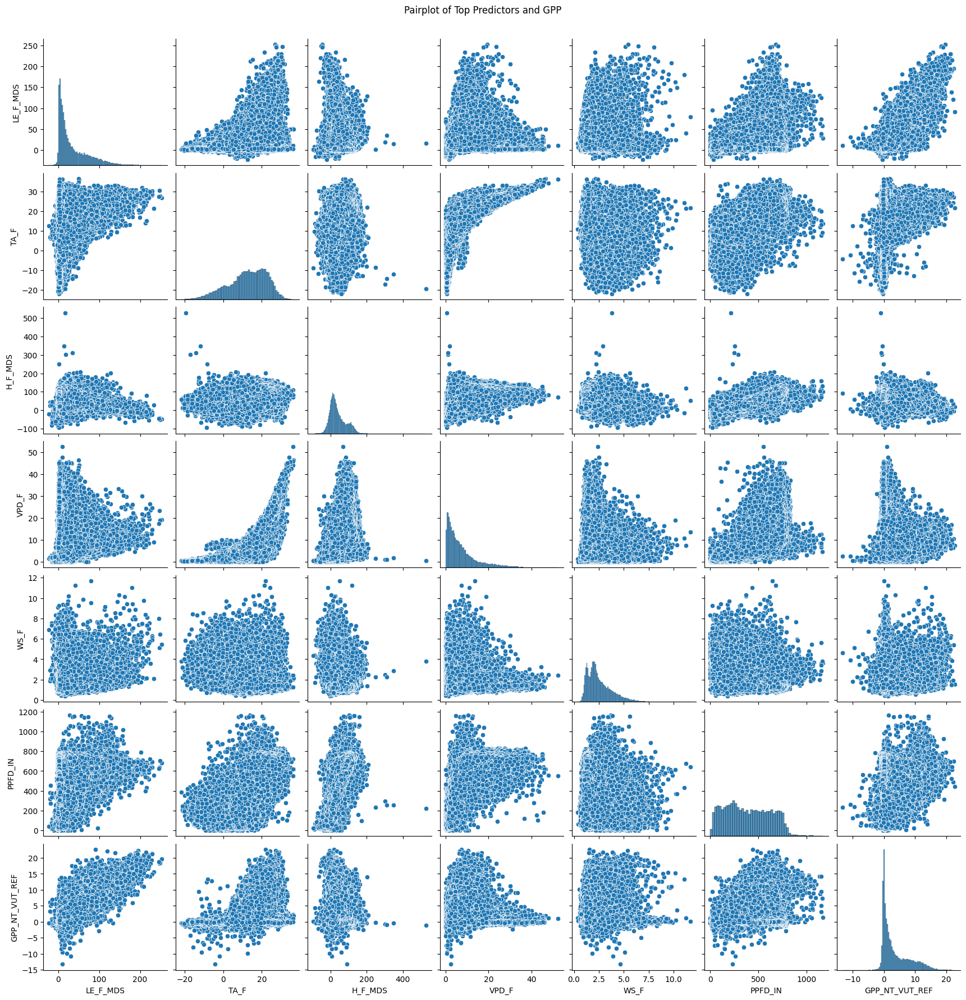

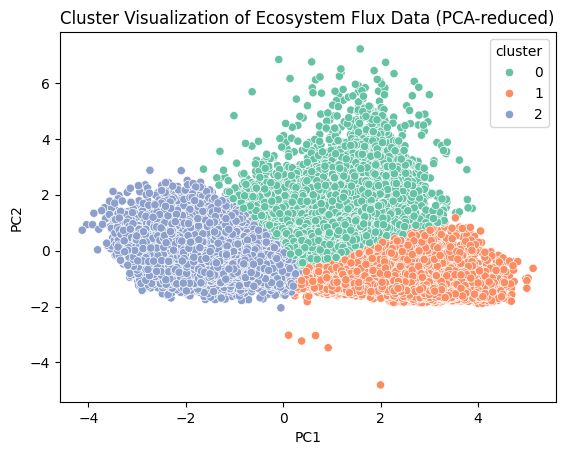

In [ ]:
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# 1. Pairplot for top predictors
top_predictors = ["LE_F_MDS", "TA_F","H_F_MDS", "VPD_F", "WS_F", "PPFD_IN"]
sns.pairplot(df_all[top_predictors + ["GPP_NT_VUT_REF"]])
plt.suptitle("Pairplot of Top Predictors and GPP", y=1.02)
plt.show()

# 2. PCA for 2D visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled[top_predictors])
df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2"])

# Apply k-means to detect clusters
kmeans = KMeans(n_clusters=3, random_state=42)
df_pca["cluster"] = kmeans.fit_predict(X_pca)

# Scatter plot of PCA-reduced features with clusters
sns.scatterplot(data=df_pca, x="PC1", y="PC2", hue="cluster", palette="Set2")
plt.title("Cluster Visualization of Ecosystem Flux Data (PCA-reduced)")
plt.show()


## Visualize findings

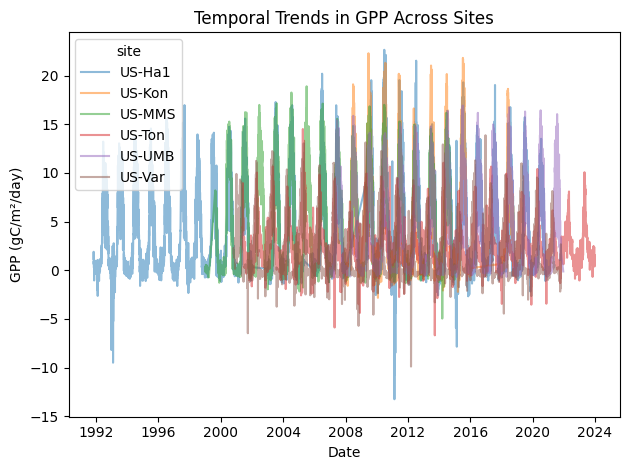

In [ ]:
import matplotlib.dates as mdates

# Convert timestamp to datetime for plotting
df_all["DATE"] = pd.to_datetime(df_all["TIMESTAMP"], format="%Y%m%d")

# Line plot of GPP per site
sns.lineplot(data=df_all, x="DATE", y="GPP_NT_VUT_REF", hue="site", alpha=0.5)
plt.title("Temporal Trends in GPP Across Sites")
plt.ylabel("GPP (gC/m²/day)")
plt.xlabel("Date")
plt.tight_layout()
plt.show()


Understaning the importance of seasons, Engineer 2 more features - month (numerical) and season (categorial)


In [ ]:
# Convert TIMESTAMP to datetime if not already done
df_scaled["DATE"] = pd.to_datetime(df_scaled["TIMESTAMP"].astype(str), format="%Y%m%d")

# Extract month and season
df_scaled["month"] = df_scaled["DATE"].dt.month

# Define season mapping (Northern Hemisphere)
def get_season(month):
    if month in [12, 1, 2]:
        return "Winter"
    elif month in [3, 4, 5]:
        return "Spring"
    elif month in [6, 7, 8]:
        return "Summer"
    else:
        return "Fall"

df_scaled["season"] = df_scaled["month"].apply(get_season)

# One-hot encode season (for linear models)
season_dummies = pd.get_dummies(df_scaled["season"], prefix="season")
df_scaled = pd.concat([df_scaled, season_dummies], axis=1)

# Add to predictors, drop 'Fall' as baseline
for col in season_dummies.columns:
    if col not in predictors:
        predictors.append(col)

# include 'month' as numeric predictor
if "month" not in predictors:
    predictors.append("month")


# Check sample
df_scaled[["DATE", "month", "season"] + list(season_dummies.columns)].head()


,DATE,month,season,season_Fall,season_Spring,season_Summer,season_Winter
27387,1991-11-03,11,Fall,True,False,False,False
27388,1991-11-04,11,Fall,True,False,False,False
27389,1991-11-05,11,Fall,True,False,False,False
27390,1991-11-06,11,Fall,True,False,False,False
27391,1991-11-07,11,Fall,True,False,False,False


Correlation with GPP (season dummies):
GPP_NT_VUT_REF    1.00
season_Winter    -0.35
season_Spring     0.02
season_Summer     0.47
season_Fall      -0.16
Name: GPP_NT_VUT_REF, dtype: float64


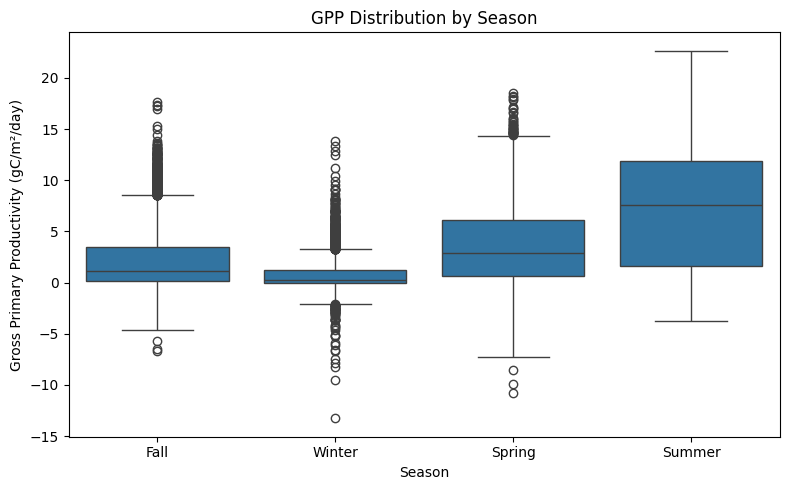

In [ ]:
# Correlation of each season dummy with GPP
season_corr = df_scaled[["GPP_NT_VUT_REF", "season_Winter", "season_Spring", "season_Summer", "season_Fall"]].corr()
print("Correlation with GPP (season dummies):")
print(season_corr["GPP_NT_VUT_REF"].round(2))

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.boxplot(x="season", y="GPP_NT_VUT_REF", data=df_scaled)
plt.title("GPP Distribution by Season")
plt.ylabel("Gross Primary Productivity (gC/m²/day)")
plt.xlabel("Season")
plt.tight_layout()
plt.show()


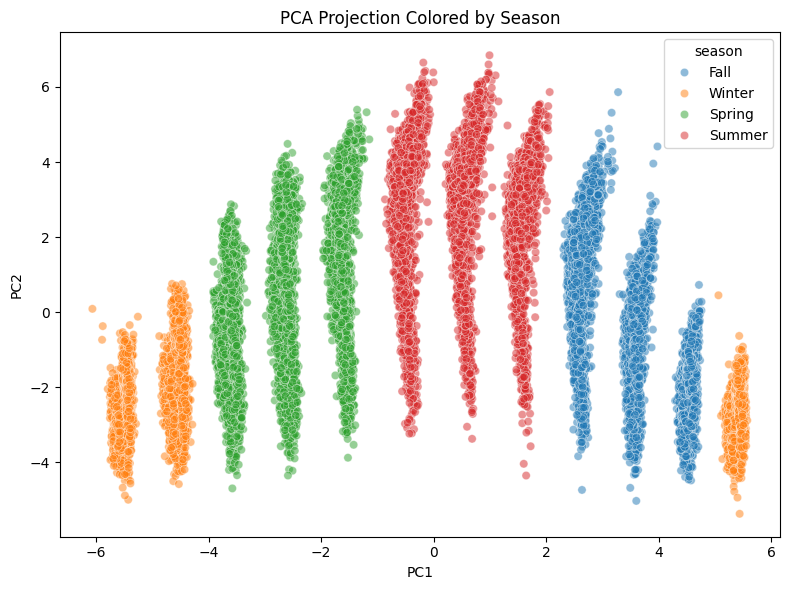

Top 10 loadings for PC1:
month                0.988208
season_Fall          0.075369
TA_F                 0.071519
season_Spring       -0.056558
TEMP_X_VPD           0.044006
VPD_F                0.041485
NETRAD              -0.037969
RADIATION_BALANCE   -0.030720
season_Winter       -0.030439
H_F_MDS             -0.029680
Name: PC1, dtype: float64

Top 10 loadings for PC2:
RADIATION_BALANCE    0.397517
PPFD_IN              0.395538
NETRAD               0.373711
TA_F                 0.332618
VPD_F                0.330537
TEMP_X_VPD           0.313361
H_F_MDS              0.289220
LE_F_MDS             0.227462
GPP_LAG1             0.171091
WS_F                -0.130019
Name: PC2, dtype: float64


In [ ]:
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Run PCA on standardized predictors (excluding GPP and season dummies)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled[predictors])

# Add to DataFrame for plotting
pca_df = pd.DataFrame(pca_result, columns=["PC1", "PC2"])
pca_df["season"] = df_scaled["season"].values

# Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x="PC1", y="PC2", hue="season", alpha=0.5)
plt.title("PCA Projection Colored by Season")
plt.tight_layout()
plt.show()

# Create a DataFrame of PCA loadings
loadings = pd.DataFrame(
    pca.components_.T,
    columns=["PC1", "PC2"],
    index=df_scaled[predictors].columns
)

# Sort by absolute value to find top contributing features
top_pc1 = loadings["PC1"].abs().sort_values(ascending=False).head(10)
top_pc2 = loadings["PC2"].abs().sort_values(ascending=False).head(10)

# Display top features contributing to PC1 and PC2
print("Top 10 loadings for PC1:")
print(loadings.loc[top_pc1.index, "PC1"])

print("\nTop 10 loadings for PC2:")
print(loadings.loc[top_pc2.index, "PC2"])

Top 10 loadings for PC1:
month                 0.988208
season_Fall           0.075369
Air Temperature       0.071519
season_Spring        -0.056558
TEMP_X_VPD            0.044006
Vapor Pressure        0.041485
Net Radiation        -0.037969
RADIATION_BALANCE    -0.030720
season_Winter        -0.030439
Sensible Heat Flux   -0.029680
Name: PC1, dtype: float64

Top 10 loadings for PC2:
RADIATION_BALANCE                     0.397517
Photosynthetic Photon Flux Density    0.395538
Net Radiation                         0.373711
Air Temperature                       0.332618
Vapor Pressure                        0.330537
TEMP_X_VPD                            0.313361
Sensible Heat Flux                    0.289220
Latent Heat Flux                      0.227462
GPP_LAG1                              0.171091
Wind Speed                           -0.130019
Name: PC2, dtype: float64


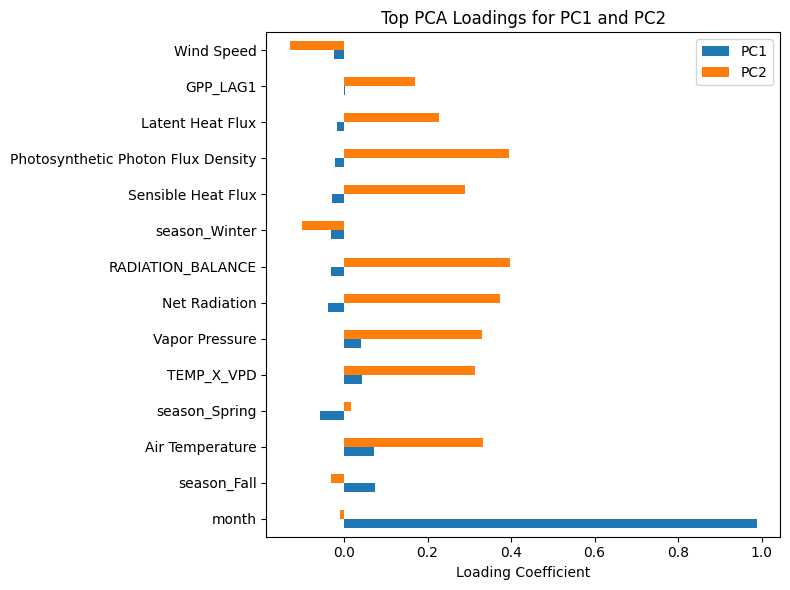

In [ ]:
# Define name mapping again (if not already in scope)
feature_names = {
    "GPP_NT_VUT_REF": "Gross Primary Productivity",
    "TA_F": "Air Temperature",
    "VPD_F": "Vapor Pressure",
    "PPFD_IN": "Photosynthetic Photon Flux Density",
    "PA_F": "Air Pressure",
    "P_F": "Precipitation",
    "WS_F": "Wind Speed",
    "LE_F_MDS": "Latent Heat Flux",
    "H_F_MDS": "Sensible Heat Flux",
    "NETRAD": "Net Radiation"
}

# Create DataFrame of loadings
loadings = pd.DataFrame(
    pca.components_.T,
    columns=["PC1", "PC2"],
    index=df_scaled[predictors].columns
)

# Top 10 contributing features for each component
top_pc1 = loadings["PC1"].abs().sort_values(ascending=False).head(10)
top_pc2 = loadings["PC2"].abs().sort_values(ascending=False).head(10)

# Rename features using dictionary
loadings_renamed = loadings.rename(index=lambda x: feature_names.get(x, x))

# Display results
print("Top 10 loadings for PC1:")
print(loadings_renamed.loc[top_pc1.index.map(lambda x: feature_names.get(x, x)), "PC1"])

print("\nTop 10 loadings for PC2:")
print(loadings_renamed.loc[top_pc2.index.map(lambda x: feature_names.get(x, x)), "PC2"])

# Combine top features (raw names)
top_features_raw = pd.concat([top_pc1, top_pc2]).index.unique()

# Map to readable names
top_features_named = [feature_names.get(f, f) for f in top_features_raw]

# Subset loadings using readable names
loadings_renamed.loc[top_features_named].plot(kind='barh', figsize=(8, 6))
plt.title("Top PCA Loadings for PC1 and PC2")
plt.xlabel("Loading Coefficient")
plt.tight_layout()
plt.show()


# **Phase 3: Supervised Learning**

## Data set-up for prediction models

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# === Define feature sets ===
gpp_history_features = predictors  # All features, including GPP_LAG1, GPP_DIFF, GPP_VAR7
gpp_independent_features = [f for f in predictors if f not in ["GPP_LAG1", "GPP_DIFF", "GPP_VAR7"]]

# === Define datasets ===
X_gpp = df_scaled[gpp_history_features]
X_no_gpp = df_scaled[gpp_independent_features]
y = df_scaled[target]

# === Train-test split (same random seed for fair comparison) ===
X_gpp_train, X_gpp_test, y_gpp_train, y_gpp_test, = train_test_split(
    X_gpp, y, test_size=0.2, random_state=42
)

X_no_gpp_train, X_no_gpp_test, y_no_gpp_train, y_no_gpp_test, = train_test_split(
    X_no_gpp, y, test_size=0.2, random_state=42
)


## 1. OLS

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import make_scorer
import numpy as np

# Define RMSE manually
def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

rmse_scorer = make_scorer(rmse, greater_is_better=False)  # Needs to be negated internally

def evaluate_ols_cv(X, y, label="", cv=5, tol=1e-5):
    model = LinearRegression()

    # Cross-validate RMSE and R²
    rmse_scores = -cross_val_score(model, X, y, cv=cv, scoring=rmse_scorer)
    r2_scores = cross_val_score(model, X, y, cv=cv, scoring='r2')

    # Train on full data to get coefficients
    model.fit(X, y)

    # Print cross-validation results
    print(f"\n=== OLS Cross-Validation Results ({label}) ===")
    print(f"Avg RMSE: {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
    print(f"Avg R²:   {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

    # Print the equation (exclude near-zero coefficients)
    coefs = model.coef_
    intercept = model.intercept_
    feature_names = X.columns
    terms = [
        f"{coef:.4f}·{name}"
        for coef, name in zip(coefs, feature_names)
        if abs(coef) > tol
    ]
    equation = f"GPP_NT_VUT_REF = {intercept:.4f}" + (" + " + " + ".join(terms) if terms else "")
    print("\nOLS Regression Equation:")
    print(equation)

    return model, rmse_scores, r2_scores


### Run OLS with GPP history

In [ ]:
OLS_model = evaluate_ols_cv(X_gpp_train, y_gpp_train, label="With GPP History")


=== OLS Cross-Validation Results (With GPP History) ===
Avg RMSE: 0.0000 ± 0.0000
Avg R²:   1.0000 ± 0.0000

OLS Regression Equation:
GPP_NT_VUT_REF = 3.5220 + 4.4323·GPP_LAG1 + 1.5364·GPP_DIFF


### Run OLS without GPP history

In [ ]:
OLS_model,_,_ = evaluate_ols_cv(X_no_gpp_train, y_no_gpp_train, label="Without GPP History")


=== OLS Cross-Validation Results (Without GPP History) ===
Avg RMSE: 1.8506 ± 0.0250
Avg R²:   0.8247 ± 0.0051

OLS Regression Equation:
GPP_NT_VUT_REF = 3.7793 + 1.1688·TA_F + -2.8530·VPD_F + 0.2283·PA_F + -0.1796·P_F + -0.0476·WS_F + 2.7669·LE_F_MDS + -0.7773·H_F_MDS + 0.5469·PPFD_IN + -0.0276·NETRAD + 1.2491·TEMP_X_VPD + 0.2683·RADIATION_BALANCE + -0.1523·season_Fall + -0.5128·season_Spring + 1.4427·season_Summer + -0.7776·season_Winter + -0.0432·month


## 2. Ridge Regression

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import make_scorer

# Define RMSE scorer (again, in case not already defined)
def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

rmse_scorer = make_scorer(rmse, greater_is_better=False)

def evaluate_ridge_cv(X, y, label="", cv=5, alphas=[0.01, 0.1, 1.0, 10.0, 100.0]):
    ridge = Ridge()
    grid = GridSearchCV(ridge, param_grid={'alpha': alphas}, cv=cv, scoring=rmse_scorer)
    grid.fit(X, y)

    best_ridge = grid.best_estimator_

    # Cross-validate with best alpha
    rmse_scores = -cross_val_score(best_ridge, X, y, cv=cv, scoring=rmse_scorer)
    r2_scores = cross_val_score(best_ridge, X, y, cv=cv, scoring='r2')

    print(f"\n=== Ridge Regression Results ({label}) ===")
    print(f"Best alpha: {grid.best_params_['alpha']}")
    print(f"Avg RMSE: {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
    print(f"Avg R²:   {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

    # Print regression equation (non-zero coefficients only)
    coefs = best_ridge.coef_
    intercept = best_ridge.intercept_
    terms = [f"{coef:.4f}·{name}" for coef, name in zip(coefs, X.columns) if abs(coef) > 1e-4]
    equation = f"GPP_NT_VUT_REF = {intercept:.4f} + " + " + ".join(terms)
    print("\nRidge Regression Equation:")
    print(equation)

    return best_ridge


In [ ]:
ridge_model = evaluate_ridge_cv(X_no_gpp, y, label="Without GPP History")


=== Ridge Regression Results (Without GPP History) ===
Best alpha: 0.01
Avg RMSE: 2.0654 ± 0.4423
Avg R²:   0.7164 ± 0.1914

Ridge Regression Equation:
GPP_NT_VUT_REF = 3.7666 + 1.1560·TA_F + -2.8222·VPD_F + 0.2228·PA_F + -0.1793·P_F + -0.0537·WS_F + 2.7771·LE_F_MDS + -0.7691·H_F_MDS + 0.5379·PPFD_IN + -0.0316·NETRAD + 1.2326·TEMP_X_VPD + 0.2616·RADIATION_BALANCE + -0.1544·season_Fall + -0.5089·season_Spring + 1.4446·season_Summer + -0.7813·season_Winter + -0.0426·month


## 3. Lasso Regression

In [ ]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
import numpy as np

def evaluate_lasso(X, y, alphas=np.logspace(-4, 1, 50), cv=5):
    lasso = LassoCV(alphas=alphas, cv=cv, random_state=42, max_iter=10000)
    lasso.fit(X, y)

    # Best alpha
    best_alpha = lasso.alpha_

    # Cross-validated RMSE and R²
    y_pred = lasso.predict(X)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    r2 = r2_score(y, y_pred)

    # Print results
    print("\n=== Lasso Regression Results (Without GPP History) ===")
    print(f"Best alpha: {best_alpha}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R²:   {r2:.4f}")

    # Print regression formula with non-zero coefficients
    coef = lasso.coef_
    intercept = lasso.intercept_

    terms = [
        f"{coef[i]:+.4f}·{X.columns[i]}"
        for i in range(len(coef)) if abs(coef[i]) > 1e-4
    ]
    equation = f"GPP_NT_VUT_REF = {intercept:.4f} " + " ".join(terms)
    print("\nLasso Regression Equation:")
    print(equation)

    return lasso


In [ ]:
lasso_model = evaluate_lasso(X_no_gpp_train, y_no_gpp_train)



=== Lasso Regression Results (Without GPP History) ===
Best alpha: 0.0001
RMSE: 1.8495
R²:   0.8250

Lasso Regression Equation:
GPP_NT_VUT_REF = 3.6250 +1.1688·TA_F -2.8463·VPD_F +0.2282·PA_F -0.1793·P_F -0.0476·WS_F +2.7674·LE_F_MDS -0.7768·H_F_MDS +0.6816·PPFD_IN +0.1088·NETRAD +1.2432·TEMP_X_VPD +0.0045·RADIATION_BALANCE -0.3588·season_Spring +1.5962·season_Summer -0.6233·season_Winter -0.0431·month


## 4. Random forest

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_regression

# Define function to evaluate Random Forest model with cross-validation
def evaluate_random_forest_cv(X, y, label="", cv=5, random_state=42):
    model = RandomForestRegressor(n_estimators=100, random_state=random_state)

    # Cross-validate RMSE and R²
    rmse_scores = -cross_val_score(model, X, y, cv=cv, scoring='neg_root_mean_squared_error')
    r2_scores = cross_val_score(model, X, y, cv=cv, scoring='r2')

    print(f"\n=== Random Forest Results ({label}) ===")
    print(f"Avg RMSE: {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
    print(f"Avg R²:   {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

    return model.fit(X, y), rmse_scores, r2_scores


In [ ]:
rf_model = evaluate_random_forest_cv(X_no_gpp_train, y_no_gpp_train, label="Without GPP History")


=== Random Forest Results (Without GPP History) ===
Avg RMSE: 1.4074 ± 0.0194
Avg R²:   0.8986 ± 0.0031


## 5. XGBoost

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer
import numpy as np

# Custom RMSE scorer
def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))
rmse_scorer = make_scorer(rmse, greater_is_better=False)

def evaluate_xgboost_cv(X, y, label="", cv=5):
    model = XGBRegressor(
        n_estimators=100,
        max_depth=5,
        learning_rate=0.1,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
        n_jobs=-1,
        verbosity=0
    )

    # Cross-validation scores
    rmse_scores = -cross_val_score(model, X, y, cv=cv, scoring=rmse_scorer)
    r2_scores = cross_val_score(model, X, y, cv=cv, scoring='r2')

    # Train model on full data (optional, for inspection)
    model.fit(X, y)

    # Print results
    print(f"\n=== XGBoost Results ({label}) ===")
    print(f"Avg RMSE: {rmse_scores.mean():.4f} ± {rmse_scores.std():.4f}")
    print(f"Avg R²:   {r2_scores.mean():.4f} ± {r2_scores.std():.4f}")

    return model


In [ ]:
xgb_model = evaluate_xgboost_cv(X_no_gpp_train, y_no_gpp_train, label="Without GPP History")



=== XGBoost Results (Without GPP History) ===
Avg RMSE: 1.4183 ± 0.0131
Avg R²:   0.8971 ± 0.0022


Top 15 Feature Importances (Natural Language):

Latent Heat Flux: 0.3234
season_Summer: 0.2295
Net Radiation: 0.1108
Sensible Heat Flux: 0.0878
month: 0.0630
Vapor Pressure: 0.0364
Air Temperature: 0.0342
season_Fall: 0.0271
TEMP_X_VPD: 0.0204
Wind Speed: 0.0156
Air Pressure: 0.0144
RADIATION_BALANCE: 0.0135
season_Spring: 0.0089
Photosynthetic Photon Flux Density: 0.0085
Precipitation: 0.0044


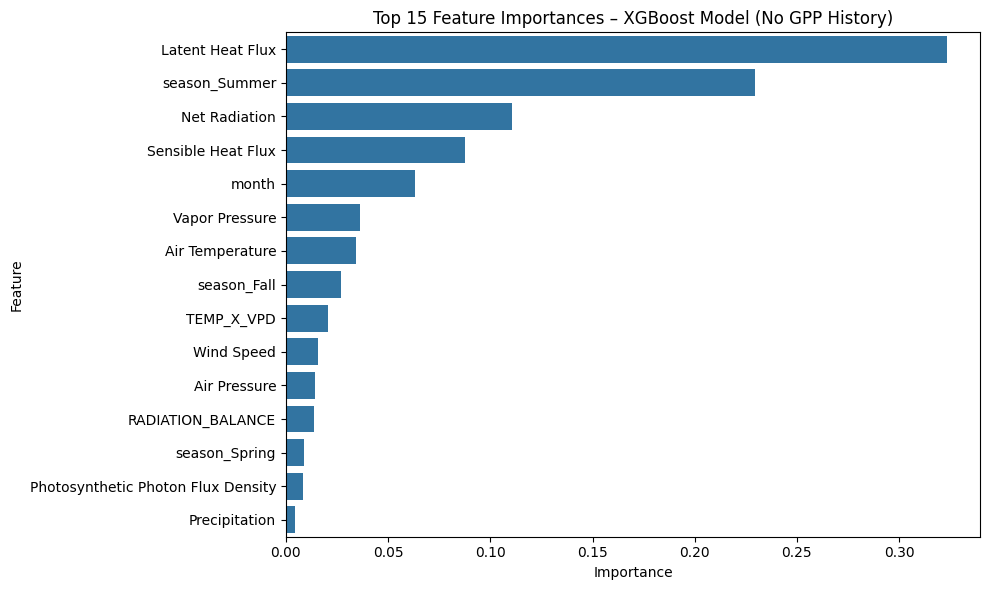

In [ ]:
# Get feature importances from the XGBoost model
importances = xgb_model.feature_importances_
feature_names_list = X_no_gpp_train.columns

# Create DataFrame
importance_df = pd.DataFrame({
    "Feature": feature_names_list,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)

# Translate feature names to natural language
importance_df["Feature"] = importance_df["Feature"].apply(lambda x: feature_names.get(x, x))

# Print top 15
top_15 = importance_df.head(15)
print("Top 15 Feature Importances (Natural Language):\n")
for i, row in top_15.iterrows():
    print(f"{row['Feature']}: {row['Importance']:.4f}")

# Plot without grid
plt.figure(figsize=(10, 6))
sns.barplot(data=top_15, x="Importance", y="Feature")
plt.title("Top 15 Feature Importances – XGBoost Model (No GPP History)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.grid(False)  # Disable grid
plt.tight_layout()
plt.show()

## 6. Support Vector Regression (SVR)

In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import make_scorer
import numpy as np

# Define RMSE manually (again, just in case)
def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

rmse_scorer = make_scorer(rmse, greater_is_better=False)

def evaluate_svr_cv(X, y, cv=5):
    # Define parameter grid
    param_grid = {
        "C": [0.1, 1, 10],
        "epsilon": [0.1, 0.5, 1],
        "kernel": ["rbf"]
    }

    svr = SVR()
    grid_search = GridSearchCV(svr, param_grid, cv=cv, scoring=rmse_scorer, n_jobs=-1)
    grid_search.fit(X, y)

    best_model = grid_search.best_estimator_

    # Cross-validate RMSE and R² using the best model
    rmse_scores = -cross_val_score(best_model, X, y, cv=cv, scoring=rmse_scorer)
    r2_scores = cross_val_score(best_model, X, y, cv=cv, scoring='r2')

    print(f"\n=== SVR Results ===")
    print(f"Best parameters: {grid_search.best_params_}")
    print(f"Avg RMSE: {np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}")
    print(f"Avg R²:   {np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}")

    return best_model, rmse_scores, r2_scores


In [ ]:
svr_model, svr_rmse, svr_r2 = evaluate_svr_cv(X_no_gpp, y)


## Test Set Evaluation

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

def evaluate_on_test_set(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)  # compute RMSE manually
    r2 = r2_score(y_test, y_pred)

    print("=== Test Set Evaluation ===")
    print(f"RMSE: {rmse:.4f}")
    print(f"R²:   {r2:.4f}")

    return y_pred  # for residual diagnostics



In [ ]:
print("")
print("\nOLS Regression Evaluation\n")
evaluate_on_test_set(OLS_model,X_no_gpp_test,y_no_gpp_test)
print("")
print("|")
print("|")
print("\nRidge Regression Evaluation\n")
evaluate_on_test_set(ridge_model,X_no_gpp_test,y_no_gpp_test)
print("")
print("|")
print("|")
print("\nLasso Regression Evaluation\n")
evaluate_on_test_set(lasso_model,X_no_gpp_test,y_no_gpp_test)
print("")
print("|")
print("|")
print("\nRandom Forest Evaluation\n")
trained_rf_model = rf_model[0]
evaluate_on_test_set(trained_rf_model,X_no_gpp_test,y_no_gpp_test)
print("")
print("|")
print("|")
print("\nXGBoost Evaluation\n")
evaluate_on_test_set(xgb_model,X_no_gpp_test,y_no_gpp_test)






OLS Regression Evaluation

=== Test Set Evaluation ===
RMSE: 1.8375
R²:   0.8314

|
|

Ridge Regression Evaluation

=== Test Set Evaluation ===
RMSE: 1.8369
R²:   0.8315

|
|

Lasso Regression Evaluation

=== Test Set Evaluation ===
RMSE: 1.8374
R²:   0.8314

|
|

Random Forest Evaluation

=== Test Set Evaluation ===
RMSE: 1.3690
R²:   0.9064

|
|

XGBoost Evaluation

=== Test Set Evaluation ===
RMSE: 1.3970
R²:   0.9025


array([ 2.8606539 , 10.90379   ,  1.1743394 , ...,  2.0596435 ,
        0.14848715,  0.04964614], dtype=float32)

## Residualest Diagnostics

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_residuals(y_true, y_pred):
    residuals = y_true - y_pred

    plt.figure(figsize=(12, 5))

    # Residuals histogram
    plt.subplot(1, 2, 1)
    sns.histplot(residuals, kde=True, bins=30)
    plt.title("Residual Distribution")
    plt.xlabel("Residuals")

    # Residuals vs Fitted using sns.residplot for automatic smoothing
    plt.subplot(1, 2, 2)
    sns.residplot(x=y_pred, y=residuals, lowess=True, scatter_kws={'alpha': 0.4}, line_kws={"color": "red", "linestyle": "--"})
    plt.title("Residuals vs. Predicted")
    plt.xlabel("Predicted GPP")
    plt.ylabel("Residuals")

    plt.tight_layout()
    plt.show()





OLS Regression Evaluation

=== Test Set Evaluation ===
RMSE: 1.8375
R²:   0.8314


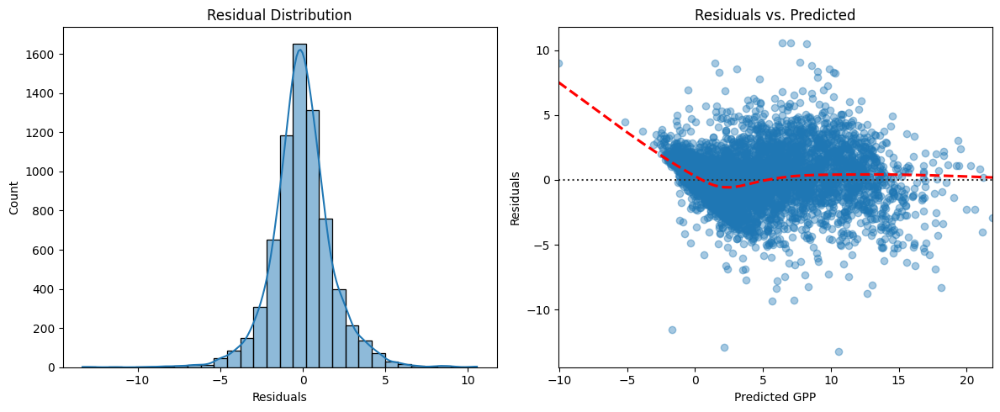


|
|

Ridge Regression Evaluation

=== Test Set Evaluation ===
RMSE: 1.8369
R²:   0.8315


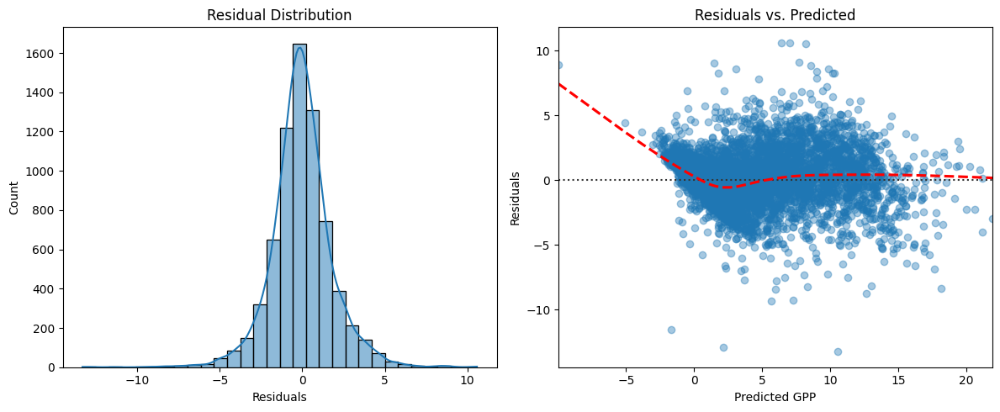


|
|

Lasso Regression Evaluation

=== Test Set Evaluation ===
RMSE: 1.8374
R²:   0.8314


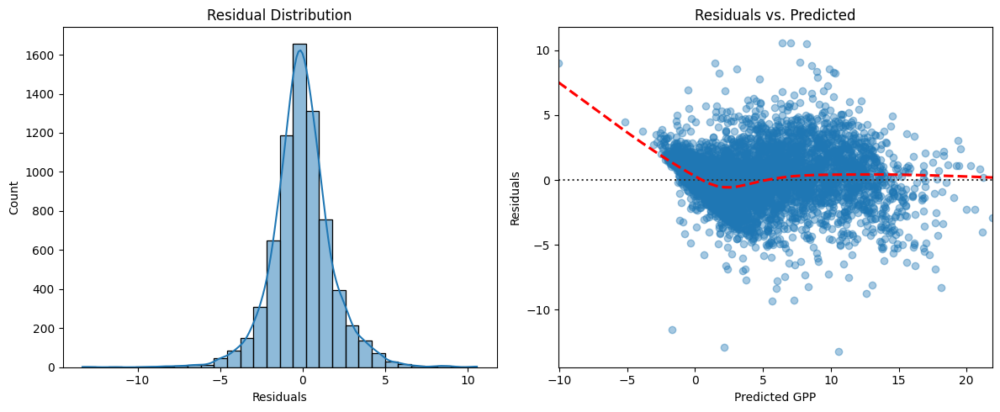


|
|

Random Forest Evaluation

=== Test Set Evaluation ===
RMSE: 1.3690
R²:   0.9064


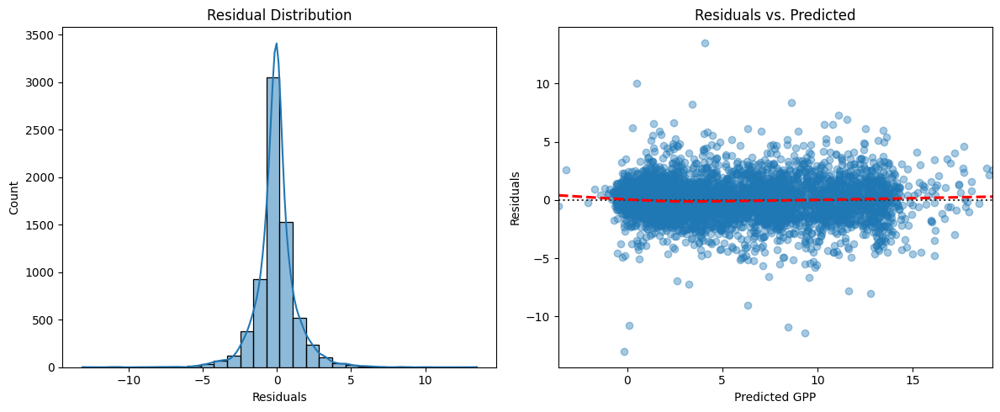


|
|

XGBoost Evaluation

=== Test Set Evaluation ===
RMSE: 1.3970
R²:   0.9025


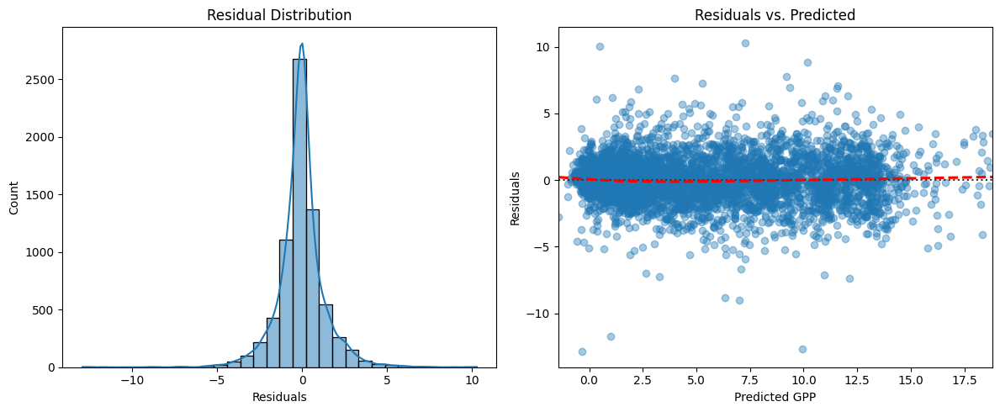

In [ ]:
# OLS Residuals
print("")
print("\nOLS Regression Evaluation\n")
y_pred_ols = evaluate_on_test_set(OLS_model, X_no_gpp_test, y_no_gpp_test)
plot_residuals(y_no_gpp_test, y_pred_ols)

# Ridge Residuals
print("")
print("|")
print("|")
print("\nRidge Regression Evaluation\n")
y_pred_ridge = evaluate_on_test_set(ridge_model, X_no_gpp_test, y_no_gpp_test)
plot_residuals(y_no_gpp_test, y_pred_ridge)

# Lasso Residuals
print("")
print("|")
print("|")
print("\nLasso Regression Evaluation\n")
y_pred_lasso = evaluate_on_test_set(lasso_model, X_no_gpp_test, y_no_gpp_test)
plot_residuals(y_no_gpp_test, y_pred_lasso)

# Random Forest Residuals
print("")
print("|")
print("|")
print("\nRandom Forest Evaluation\n")
y_pred_rf = evaluate_on_test_set(rf_model[0], X_no_gpp_test, y_no_gpp_test)
plot_residuals(y_no_gpp_test, y_pred_rf)

# XGBoost Residuals
print("")
print("|")
print("|")
print("\nXGBoost Evaluation\n")
y_pred_xgb = evaluate_on_test_set(xgb_model, X_no_gpp_test, y_no_gpp_test)
plot_residuals(y_no_gpp_test, y_pred_xgb)


# **Phase 4: Unsupervised Learning**

## Prepare data for clustering

In [ ]:
from sklearn.preprocessing import StandardScaler

# Select features for unsupervised learning (no GPP target or lagged features)
unsupervised_features = [
    f for f in predictors
    if f not in ["GPP_NT_VUT_REF", "GPP_LAG1", "GPP_DIFF", "GPP_VAR7","season","month"]
]

X_unsupervised = df_scaled[unsupervised_features]


In [ ]:
print(df_scaled["month"])

27387    11
27388    11
27389    11
27390    11
27391    11
         ..
6365     10
6366     10
6367     10
6368     10
6369     10
Name: month, Length: 35411, dtype: int32


## K-means

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

def run_kmeans_clustering(X, k=3):
    # Run KMeans
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(X)

    # Compute silhouette score
    sil_score = silhouette_score(X, cluster_labels)

    # PCA for visualization
    pca = PCA(n_components=2)
    components = pca.fit_transform(X)

    # Plot clusters in PCA space
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=cluster_labels, palette='Set2', alpha=0.6)
    plt.title(f"K-Means Clustering (k={k}) in PCA Space\nSilhouette Score = {sil_score:.3f}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.tight_layout()
    plt.show()

    return cluster_labels, sil_score


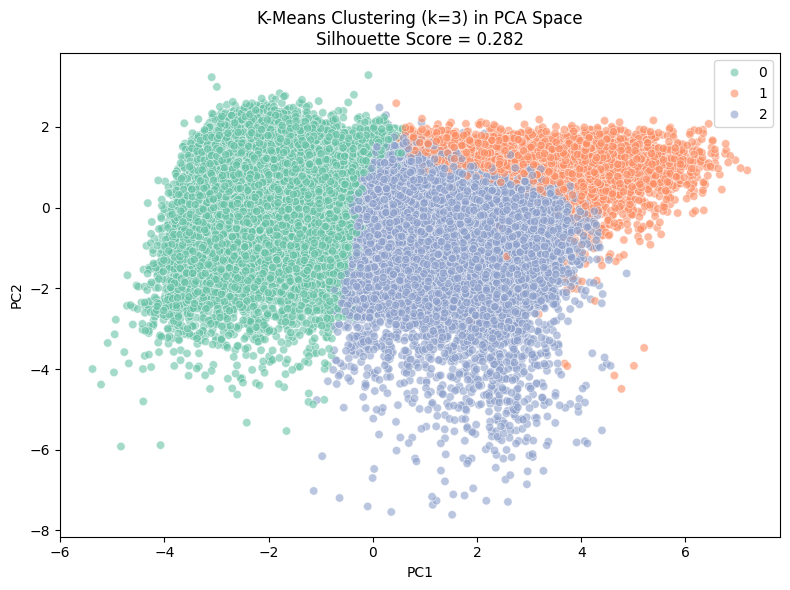

Silhouette Score for K-Means Clustering(k=3): 0.282


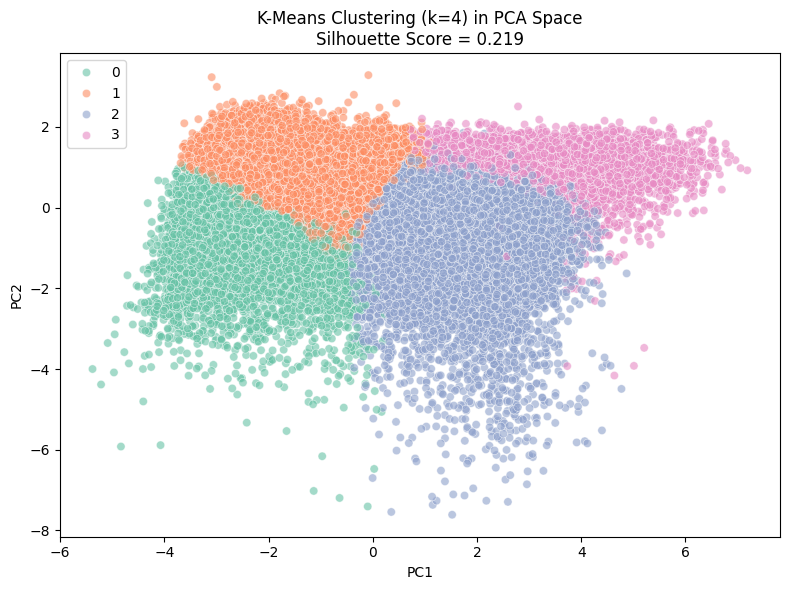

Silhouette Score for K-Means Clustering(k=4): 0.219


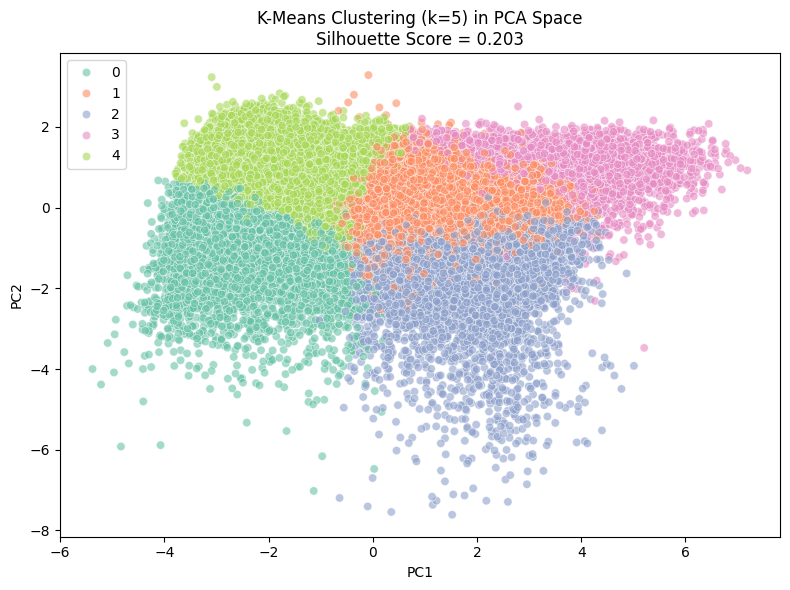

Silhouette Score for K-Means Clustering(k=5): 0.203


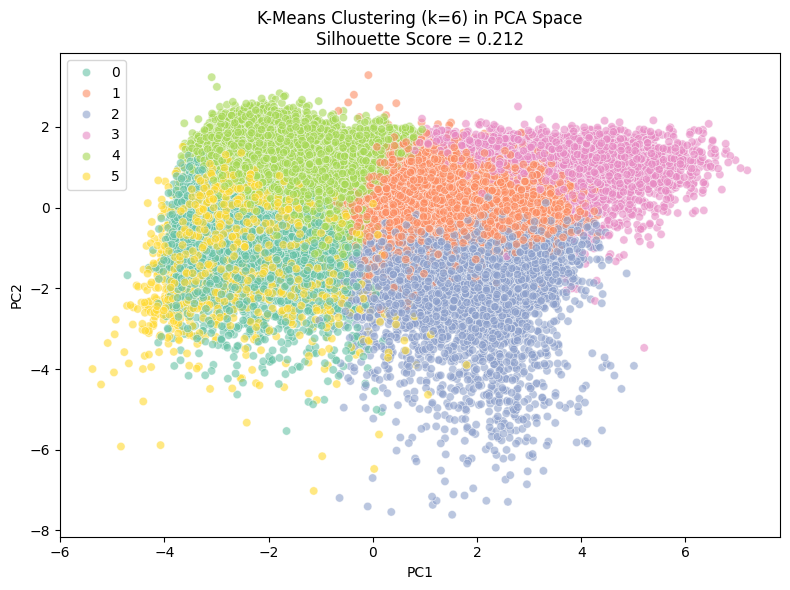

Silhouette Score for K-Means Clustering(k=6): 0.212


In [ ]:
for i in range(3, 7):
    kmeans_labels, kmeans_sil = run_kmeans_clustering(X_unsupervised, k=i)
    print(f"Silhouette Score for K-Means Clustering(k={i}): {kmeans_sil:.3f}")


## Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

def run_agglomerative_clustering(X, n_clusters=3):
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    labels = model.fit_predict(X)

    # Compute Silhouette Score
    sil_score = silhouette_score(X, labels)

    # PCA for visualization
    pca = PCA(n_components=2)
    components = pca.fit_transform(X)

    # Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=labels, palette='Set2', alpha=0.6)
    plt.title(f"Agglomerative Clustering (k={n_clusters}) in PCA Space\nSilhouette Score = {sil_score:.3f}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.tight_layout()
    plt.show()

    return labels, sil_score


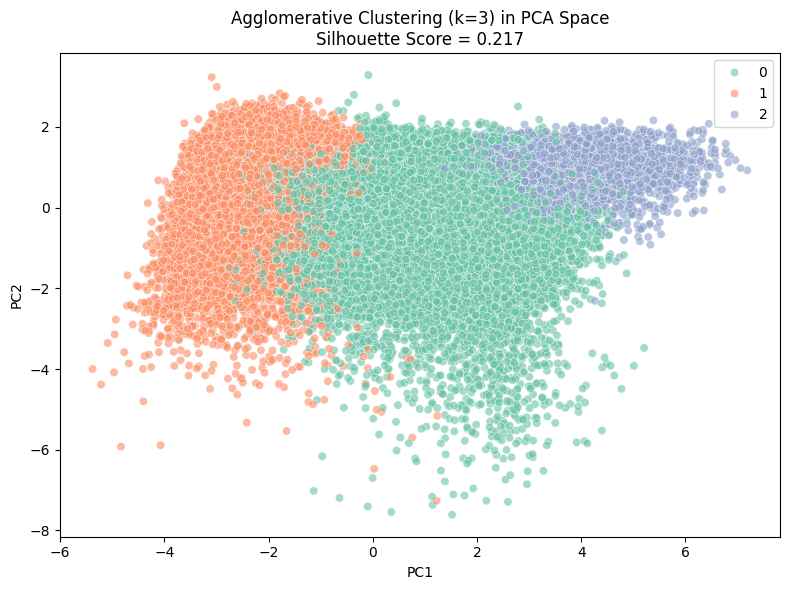

Silhouette Score for Agglomerative Clustering (k=3): 0.217


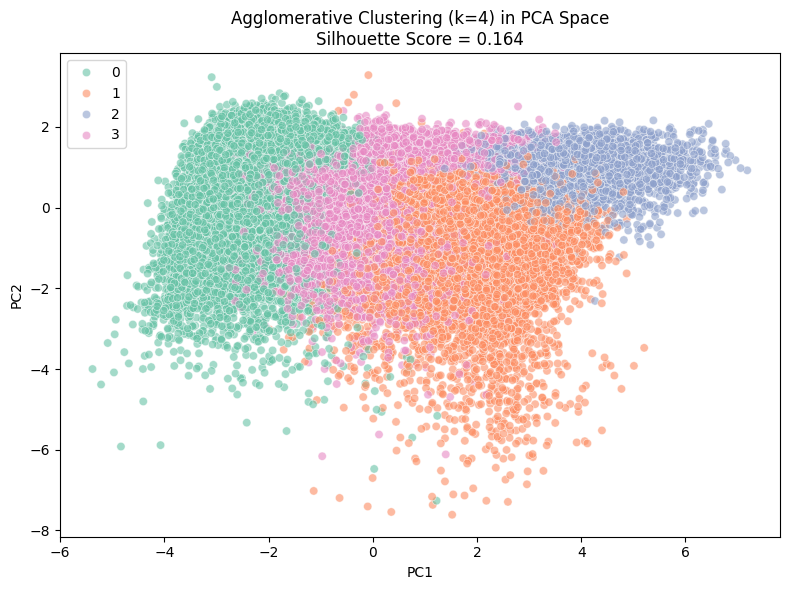

Silhouette Score for Agglomerative Clustering (k=4): 0.164


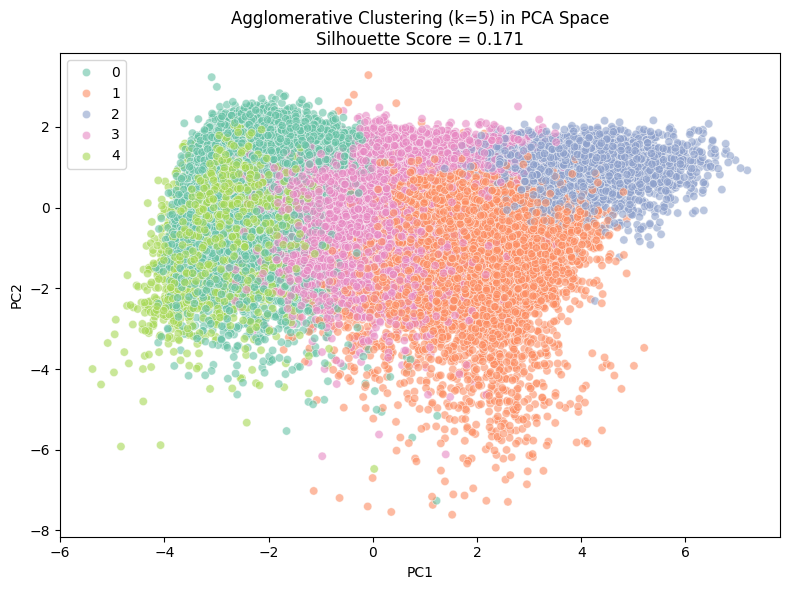

Silhouette Score for Agglomerative Clustering (k=5): 0.171


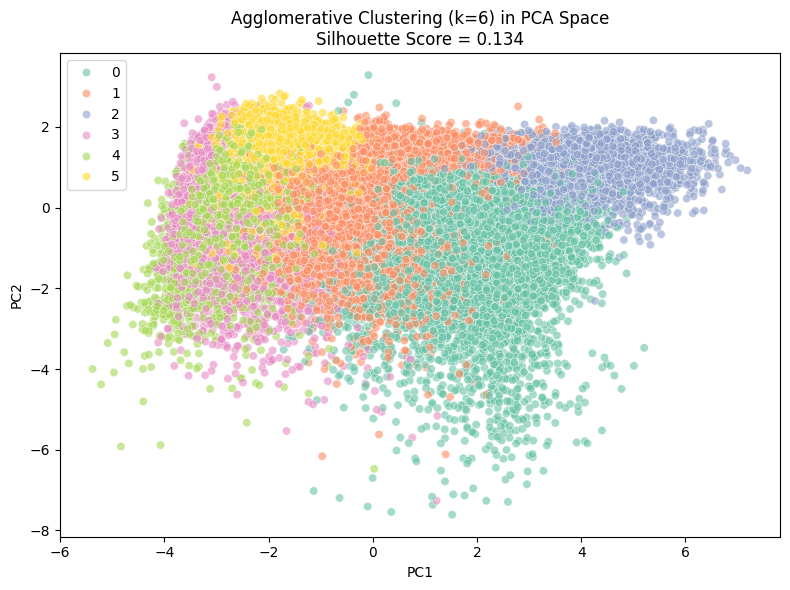

Silhouette Score for Agglomerative Clustering (k=6): 0.134


In [ ]:
for k in range(3, 7):
    _, score = run_agglomerative_clustering(X_unsupervised , n_clusters=k)
    print(f"Silhouette Score for Agglomerative Clustering (k={k}): {score:.3f}")


## DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

def run_dbscan_and_evaluate(X, eps_values, min_samples_values):
    for eps in eps_values:
        for min_samples in min_samples_values:
            db = DBSCAN(eps=eps, min_samples=min_samples)
            labels = db.fit_predict(X)
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1)

            # Only compute silhouette score if more than 1 cluster
            if n_clusters > 1:
                score = silhouette_score(X[labels != -1], labels[labels != -1])
                print(f"DBSCAN (eps={eps}, min_samples={min_samples}): "
                      f"{n_clusters} clusters, {n_noise} noise points, Silhouette Score: {score:.3f}")
            else:
                print(f"DBSCAN (eps={eps}, min_samples={min_samples}): "
                      f"{n_clusters} clusters, {n_noise} noise points, Silhouette Score: N/A (insufficient clusters)")


In [ ]:
eps_values = [0.5, 1.0, 1.5]
min_samples_values = [5, 10, 15, 20]

run_dbscan_and_evaluate(X_unsupervised.values, eps_values, min_samples_values)


DBSCAN (eps=0.5, min_samples=5): 169 clusters, 21022 noise points, Silhouette Score: -0.322
DBSCAN (eps=0.5, min_samples=10): 53 clusters, 25325 noise points, Silhouette Score: -0.118
DBSCAN (eps=0.5, min_samples=15): 28 clusters, 27747 noise points, Silhouette Score: -0.080
DBSCAN (eps=0.5, min_samples=20): 17 clusters, 29344 noise points, Silhouette Score: 0.144
DBSCAN (eps=1.0, min_samples=5): 22 clusters, 2090 noise points, Silhouette Score: 0.045
DBSCAN (eps=1.0, min_samples=10): 5 clusters, 2966 noise points, Silhouette Score: 0.061
DBSCAN (eps=1.0, min_samples=15): 8 clusters, 3726 noise points, Silhouette Score: 0.052
DBSCAN (eps=1.0, min_samples=20): 4 clusters, 4415 noise points, Silhouette Score: 0.124
DBSCAN (eps=1.5, min_samples=5): 2 clusters, 266 noise points, Silhouette Score: 0.527
DBSCAN (eps=1.5, min_samples=10): 1 clusters, 455 noise points, Silhouette Score: N/A (insufficient clusters)
DBSCAN (eps=1.5, min_samples=15): 1 clusters, 557 noise points, Silhouette Score

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

def plot_dbscan_clusters(X, labels, title="DBSCAN Clustering in PCA Space"):
    # Reduce to 2D for visualization
    pca = PCA(n_components=2)
    components = pca.fit_transform(X)

    # Create a DataFrame for plotting
    plot_df = pd.DataFrame(components, columns=["PC1", "PC2"])
    plot_df["Cluster"] = labels.astype(str)
    plot_df.loc[plot_df["Cluster"] == "-1", "Cluster"] = "Noise"  # Label noise points clearly

    # Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=plot_df, x="PC1", y="PC2", hue="Cluster", palette="tab20", alpha=0.6)
    plt.title(title)
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


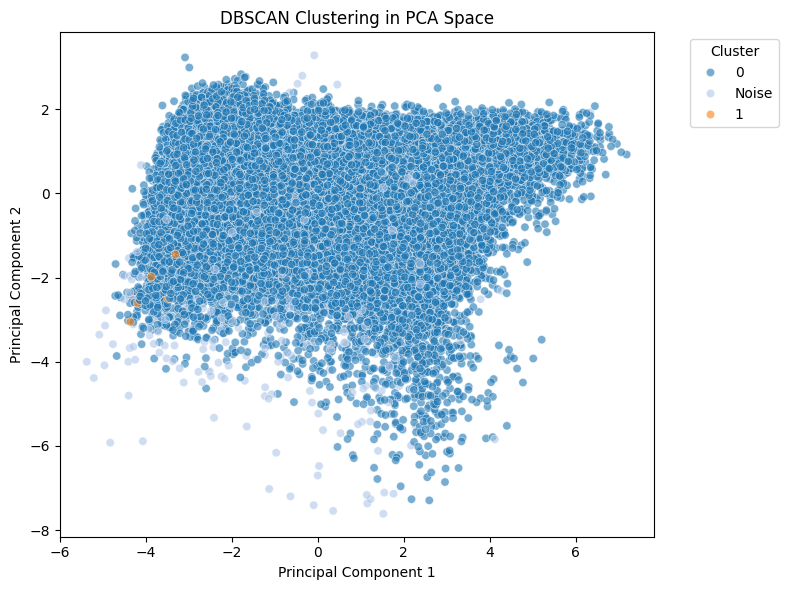

In [ ]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=1.5, min_samples=5)
dbscan.fit(X_unsupervised)

dbscan_labels = dbscan.labels_

plot_dbscan_clusters(X_unsupervised, dbscan_labels)



## Bonus - sites seperation

### PCA with temporal predictors

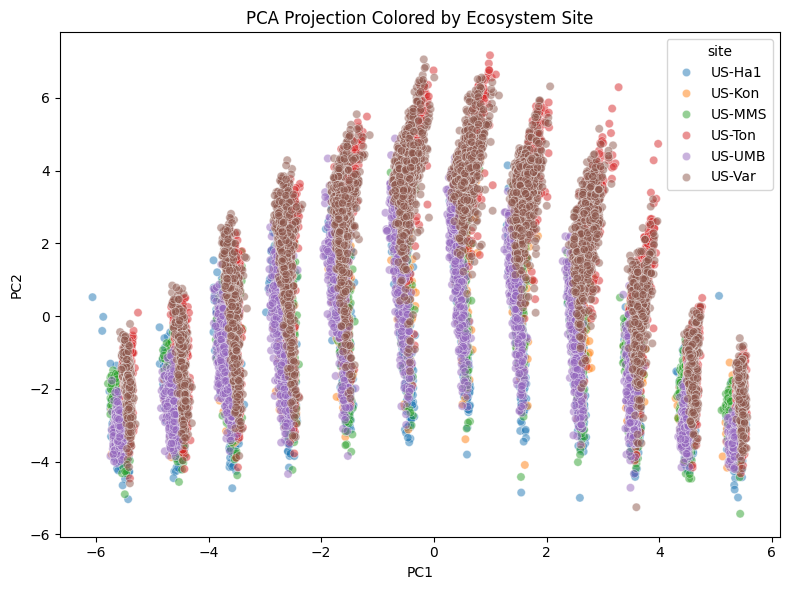

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA


# Select features for unsupervised learning (no GPP target or lagged features)
unsupervised_temporal_features = [
    f for f in predictors
    if f not in ["GPP_NT_VUT_REF", "GPP_LAG1", "GPP_DIFF", "GPP_VAR7"]
]

X_unsupervised_temporal = df_scaled[unsupervised_temporal_features]

# Run PCA on scaled features
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_unsupervised_temporal)

# Create DataFrame with PCA results and site labels
pca_df = pd.DataFrame(pca_result, columns=["PC1", "PC2"])
pca_df["site"] = df_all["site"].values  # assuming site is in the original DataFrame

# Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x="PC1", y="PC2", hue="site", alpha=0.5)
plt.title("PCA Projection Colored by Ecosystem Site")
plt.tight_layout()
plt.show()


### PCA without temporal predictors

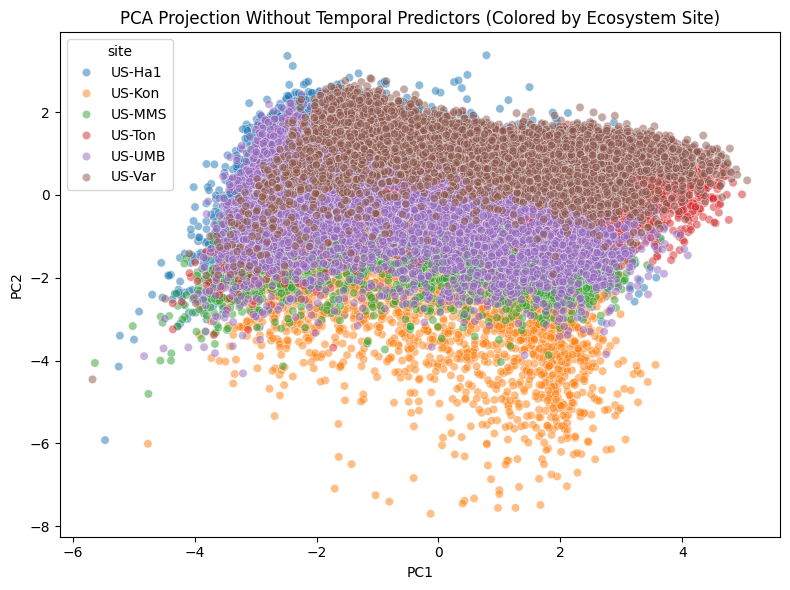

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Define a reduced feature set without temporal predictors
temporal_features = ['GPP_LAG1', 'GPP_DIFF', 'GPP_VAR7', 'TEMP_X_VPD',
                     'RADIATION_BALANCE', 'month'] + [col for col in df_scaled.columns if col.startswith('season_')]

# Keep only features that are not in the temporal list
non_temporal_features = [col for col in X_unsupervised.columns if col not in temporal_features]

# Run PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_unsupervised[non_temporal_features])

# Create DataFrame with PCA results and site labels
pca_df = pd.DataFrame(pca_result, columns=["PC1", "PC2"])
pca_df["site"] = df_all["site"].values

# Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x="PC1", y="PC2", hue="site", alpha=0.5)
plt.title("PCA Projection Without Temporal Predictors (Colored by Ecosystem Site)")
plt.tight_layout()
plt.show()